# Greedy Heuristics

## Imports

In [2]:
import numpy as np
np.random.seed(42)
import pandas as pd
import math
import seaborn as sns

import matplotlib.pyplot as plt
import matplotlib.cm as cm

## Constants Declarations

In [3]:
TSPA_PATH = "../data/TSPA.csv"
TSPB_PATH = "../data/TSPB.csv"

## Read Data

In [4]:
df = pd.read_csv(TSPA_PATH, sep=";", header=None)
df.columns = ["x", "y", "val"]
df

,x,y,val
0,1355,1796,496
1,2524,387,414
2,2769,430,500
3,3131,1199,1133
4,661,87,903
...,...,...,...
195,189,1151,1145
196,3688,759,727
197,973,984,1637
198,910,1383,1255


## Utils

In [5]:
def math_round(n):
    '''
    Mathematically rounds up to the nearest integer, always rounds up for 0.5

    ParametersL
    n: floating point number to round
    '''
    if n - math.floor(n) < 0.5:
        return math.floor(n)
    return math.ceil(n)

In [6]:
def plot_nodes_with_lines(df, connections=None):
    """
    Plots nodes with optional lines connecting them, using a color scale to represent values.
    
    Parameters:
    df: DataFrame of nodes, each with 'x', 'y', and 'val'.
    connections: list of node indices in the DataFrame to connect in order.
    """
    plt.figure(figsize=(14, 7))
    norm = plt.Normalize(vmin=df.val.min(), vmax=df.val.max())
    colors = cm.Reds(norm(df.val))
    scatter = plt.scatter(df.x, df.y, c=df.val, cmap='Reds', s=100, edgecolors='black')

    if connections is not None:
        for start, end in zip(connections[:-1], connections[1:]):
            plt.plot([df.x[start], df.x[end]], [df.y[start], df.y[end]], color='blue')
        plt.plot([df.x[connections[-1]], df.x[connections[0]]], [df.y[connections[-1]], df.y[connections[0]]], color='blue')
    cbar = plt.colorbar(scatter)
    cbar.set_label('Node Cost')

    plt.xlabel('X')
    plt.ylabel('Y')
    title = 'Nodes with Color-Scaled Values' if connections is None else 'Nodes with Values and Connections'
    plt.title(title)
    plt.grid(False)
    plt.show()


def get_distance_matrix(df, distance_function):
    """
    Calculates the distance matrix for a set of nodes using the given distance function.

    Parameters:
    nodes: DataFrame of nodes, each with 'x', 'y', and 'val'.
    distance_function: function that takes two points (x1, y1) and (x2, y2) and returns the distance.

    Returns:
    A 2D numpy array representing the distance matrix.
    """
    positions = df[["x", "y"]]
    num_nodes = len(positions)
    distance_matrix = np.zeros((num_nodes, num_nodes), dtype=np.int64)

    for i in range(num_nodes):
        for j in range(i, num_nodes):
            dist = round(distance_function(positions.iloc[i], positions.iloc[j]))
            distance_matrix[i, j] = dist
            distance_matrix[j, i] = dist

    return distance_matrix


def calculate_score(solution, matrix, weights):
    '''
    Calculates solution score based on the matrix of distances and provided weights array.

    Parameters:
    solution: List or array of the solution
    matrix: Numpy array with node distances (2D)
    weights: Numpy array with node weights (1D - vector)
    '''
    score = 0
    for i in range(len(solution)-1):
        node_1 = solution[i]
        node_2 = solution[i+1]
        score += (matrix[node_1][node_2] + weights[node_1])
    node_1 = solution[-1]
    node_2 = solution[0]
    score += (matrix[node_1][node_2] + weights[node_1])
    return score

def euclidean_distance(point1, point2):
    return np.linalg.norm(point1 - point2)

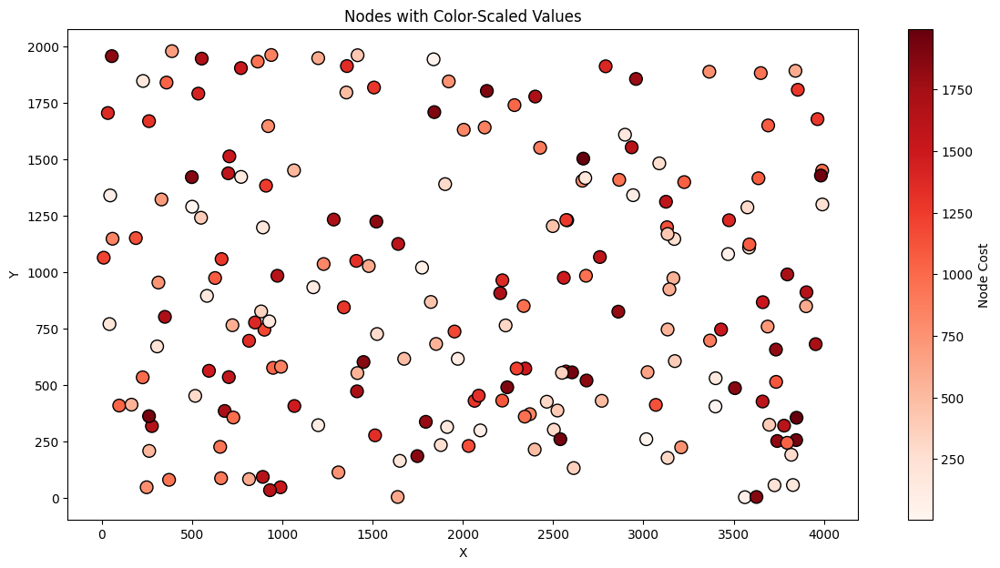

In [7]:
temp_df_a = pd.read_csv(TSPA_PATH, sep=";", header=None)
temp_df_a.columns = ["x", "y", "val"]
plot_nodes_with_lines(temp_df_a)

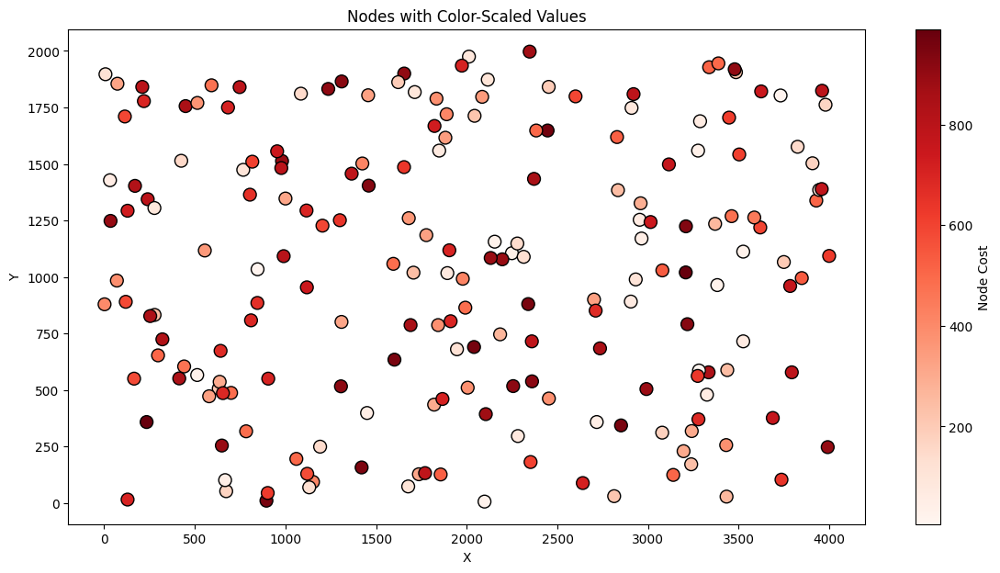

In [8]:
temp_df_a = pd.read_csv(TSPB_PATH, sep=";", header=None)
temp_df_a.columns = ["x", "y", "val"]
plot_nodes_with_lines(temp_df_a)

## Random Solution

In [9]:
distance_matrix = get_distance_matrix(df, euclidean_distance)
pd.DataFrame(distance_matrix)

,0,1,2,3,4,5,6,7,8,9,...,190,191,192,193,194,195,196,197,198,199
0,0,1831,1966,1874,1845,1097,1658,2297,2193,1364,...,1977,746,1414,993,1527,1333,2553,897,607,1100
1,1831,0,249,1014,1887,1985,802,1872,1270,1027,...,2173,2104,2213,2215,1016,2457,1222,1662,1897,2600
2,1966,249,0,850,2136,2209,1050,1698,1066,981,...,2421,2301,2447,2426,1264,2679,976,1880,2089,2796
3,1874,1014,850,0,2709,2513,1715,858,344,512,...,2976,2442,2809,2632,1861,2942,710,2169,2229,2907
4,1845,1887,2136,2709,0,888,1091,3487,3036,2396,...,288,1352,780,1214,874,1164,3101,950,1320,1632
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
195,1333,2457,2679,2942,1164,473,1834,3537,3286,2486,...,1087,587,384,342,1587,0,3521,802,757,523
196,2553,1222,976,710,3101,3068,2023,1124,517,1212,...,3384,3063,3338,3231,2227,3521,0,2724,2847,3545
197,897,1662,1880,2169,950,345,1113,2824,2513,1741,...,1085,529,649,563,890,802,2724,0,404,987
198,607,1897,2089,2229,1320,497,1462,2785,2569,1752,...,1409,216,807,419,1260,757,2847,404,0,708


In [10]:
weights = df.val.to_numpy()
weights[:2]

array([496, 414], dtype=int64)

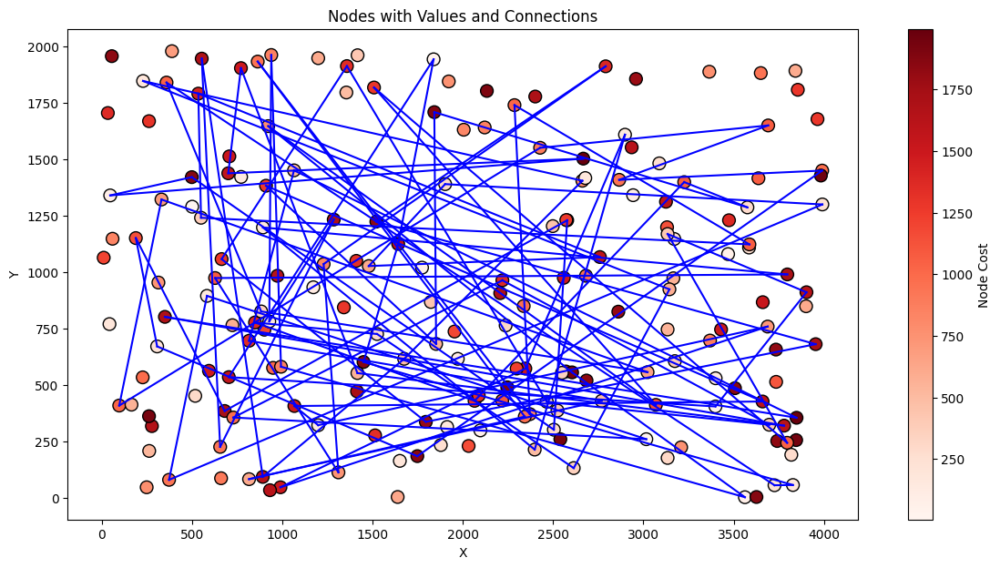

Acheived Total Score: 268909


In [11]:
def random_solution(distance_matrix, weights, start_node):
    '''
    Returns a random solution to the TSP problem based on the provided distance matrix.

    Parameters:
    distance_matrix: numpy.array containing distances between the nodes.
    weights: numpy.array containing the weights associated with each node.
    start_node: int, the index of the node from which the cycle starts.
    '''

    remaining_nodes = list(range(len(distance_matrix)))
    remaining_nodes.remove(start_node)
    np.random.shuffle(remaining_nodes)
    solution = [start_node] + remaining_nodes[:len(distance_matrix)//2 - 1]
    score = calculate_score(solution, distance_matrix, weights)
    return solution, score

sol, score = random_solution(distance_matrix, weights, np.random.randint(0, len(weights)))
sol = np.append(sol, sol[0])
plot_nodes_with_lines(df, sol)
print(f"Acheived Total Score: {score}")

## Nearest Neighbor - End of Path

In [12]:
def nearest_neighbor_end(distance_matrix, weights, start_node):
    '''
    Greedy solution to the TSP problem that selects the closest node to the previously selected.

    Parameters:
    distance_matrix: numpy.array containing distances between nodes.
    weights: numpy.array containing the weights associated with each node.
    start_node: int, the index of the node from which the cycle starts.
    '''
    d_matrix = np.copy(distance_matrix)
    d_matrix = d_matrix.astype(np.float64)
    np.fill_diagonal(d_matrix, np.inf)
    num_nodes = d_matrix.shape[0]
    solution = np.zeros(num_nodes//2, dtype=np.int64)

    solution[0] = start_node
    d_matrix[start_node] = np.inf
    
    next_node = start_node
    i = 1
    while i < num_nodes//2:
        next_node = np.argmin(d_matrix[:, next_node] + weights)
        d_matrix[next_node] = np.inf
        solution[i] = next_node
        i += 1

    score = calculate_score(solution, distance_matrix, weights)
    return solution, score

In [13]:
df['distance'] = np.sqrt(df['x']**2 + df['y']**2)
    
# Get the row with the minimum distance
start_node = df.iloc[df['distance'].idxmin()].name
start_node

10

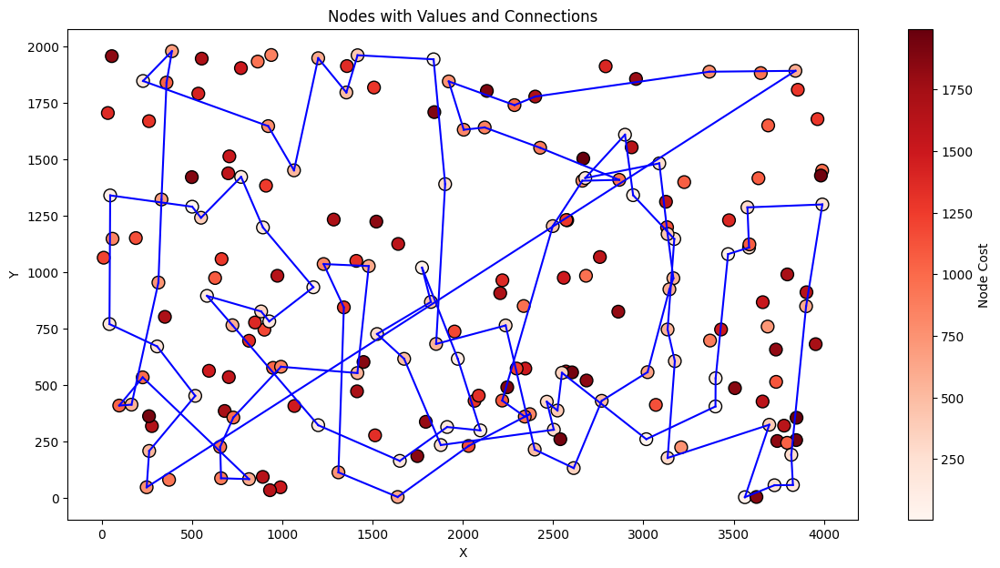

(x           249.000000
 y            47.000000
 val         774.000000
 distance    253.396922
 Name: 10, dtype: float64,
 86282)

In [14]:
sol, score = nearest_neighbor_end(distance_matrix, weights, start_node)
sol = np.append(sol, sol[0])
plot_nodes_with_lines(df, sol)
df.iloc[start_node], score

## Nearest Neighbor - Adding Node at All Positions

In [15]:
def nearest_neighbor_all(distance_matrix, weights, start_node):
    '''
    Greedy solution to the TSP problem that selects the closest node from all previously selected.

    Parameters:
    distance_matrix: numpy.array containing distances between nodes.
    weights: numpy.array containing the weights associated with each node.
    start_node: int, the index of the node from which the cycle starts.
    '''
    # Convert the distance matrix to float and initialize variables
    d_matrix = distance_matrix.astype(np.float64, copy=True)
    num_nodes = d_matrix.shape[0]
    nodes_in_solution = np.zeros(num_nodes, dtype=bool)

    solution = [start_node]
    nodes_in_solution[start_node] = True

    # Initialize an array to track the best cost for each node
    best_costs = np.full(num_nodes, np.inf)
    best_positions = np.zeros(num_nodes, dtype=int)

    while len(solution) < num_nodes // 2:
        # Update best costs and positions for unused nodes
        for j in range(num_nodes):
            if nodes_in_solution[j]:
                continue

            # Calculate insertion costs at beginning and end
            cost_0 = weights[j] + d_matrix[j, solution[0]]
            cost_inf = weights[j] + d_matrix[j, solution[-1]]

            # Default best position and cost
            best_pos_cost = min(cost_0, cost_inf)
            best_pos = 0 if cost_0 < cost_inf else len(solution)

            # Check all intermediate positions for a better cost
            for inter_pos in range(len(solution) - 1):
                inter_cost = (
                    d_matrix[solution[inter_pos], j] +
                    d_matrix[j, solution[inter_pos + 1]] -
                    d_matrix[solution[inter_pos], solution[inter_pos + 1]] +
                    weights[j]
                )
                
                if inter_cost < best_pos_cost:
                    best_pos_cost = inter_cost
                    best_pos = inter_pos + 1

            # Store the best cost and position for node j
            best_costs[j] = best_pos_cost
            best_positions[j] = best_pos

        # Find the node with the minimum insertion cost
        best_insert_node = np.argmin(best_costs)
        best_insert_position = best_positions[best_insert_node]

        # Insert the best node and mark it as added
        solution.insert(best_insert_position, best_insert_node)
        nodes_in_solution[best_insert_node] = True

        # Reset best cost for the newly added node
        best_costs[best_insert_node] = np.inf

    # Calculate the final score
    score = calculate_score(solution, distance_matrix, weights)
    return solution, score


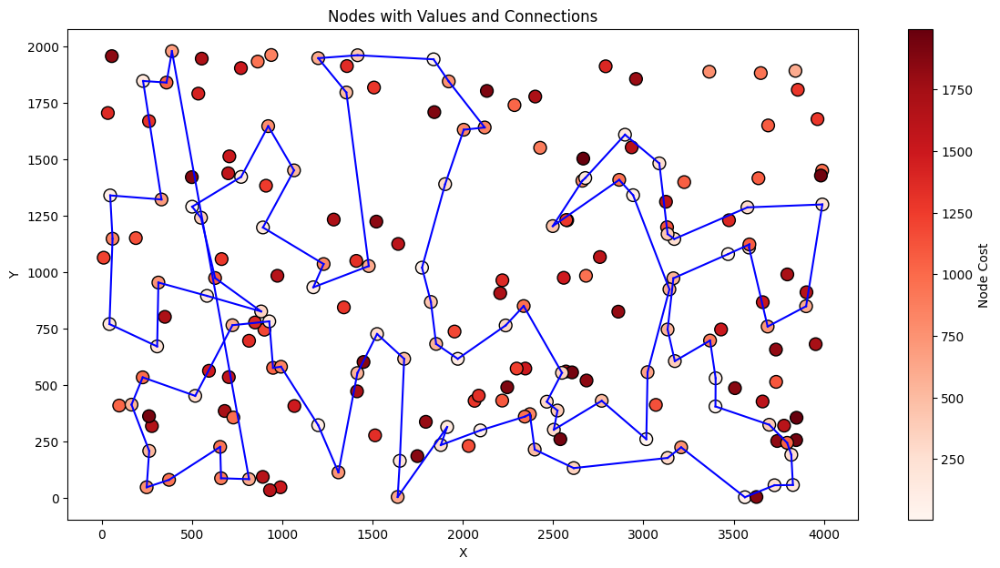

(x           249.000000
 y            47.000000
 val         774.000000
 distance    253.396922
 Name: 10, dtype: float64,
 73940)

In [16]:
sol, score = nearest_neighbor_all(distance_matrix, weights, start_node)
sol.append(sol[0])
plot_nodes_with_lines(df, sol)
df.iloc[start_node], score

In [17]:
len(sol)

101

## Greedy Cycle

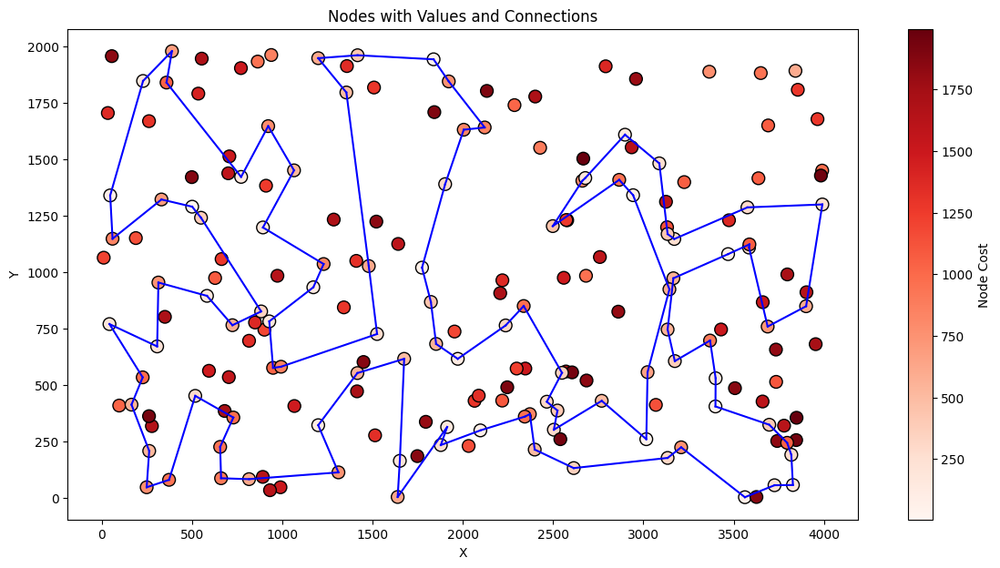

Acheived Total Score: 72712


In [18]:
def greedy_cycle(matrix, weights, starting_node):
    '''
    Implements a greedy cycle algorithm to solve the Traveling Salesman Problem (TSP).

    Parameters:
    matrix: numpy.array containing distances between nodes.
    weights: numpy.array containing the weights associated with each node.
    starting_node: int, the index of the node from which the cycle starts.
    '''
    distance_matrix = np.copy(matrix)
    distance_matrix = distance_matrix.astype(np.float64)
    np.fill_diagonal(distance_matrix, np.inf)
    solution = []
    num_nodes = distance_matrix.shape[0]
    score = 0

    distance_matrix[starting_node] = np.inf
    second_node = np.argmin(distance_matrix[:, starting_node] + weights)
    distance_matrix[second_node] = np.inf
    third_node = np.argmin(distance_matrix[:, starting_node] + distance_matrix[:, second_node] + weights)
    distance_matrix[third_node] = np.inf
    solution = [starting_node, second_node, third_node]
    score = calculate_score_three(solution, matrix, weights)

    num_iterations = round(num_nodes*0.5)-3
    for i in range(num_iterations):
        best_score = np.inf
        best_solution = None
        best_node = None
        for ii in range(len(solution)):
            new_score, new_solution, new_node = find_shortest_cycle(score, distance_matrix, matrix, weights, solution.copy(), ii)
            if new_score < best_score:
                best_score = new_score
                best_solution = new_solution
                best_node = new_node
        solution = best_solution.copy()
        score = best_score
        distance_matrix[best_node] = np.inf

    solution.append(solution[0])
    return solution, score

def calculate_score_three(solution, matrix, weights):
    '''
    Calculates the score (total distance) for a TSP cycle for the first three nodes. 

    Parameters:
    solution: list of three ints representing the node indices of the current cycle.
    matrix: numpy.array containing distances between nodes.
    weights: numpy.array containing the weights associated with each node.
    '''
    score = 0
    node_1 = solution[0]
    node_2 = solution[1]
    node_3 = solution[2]
    score += matrix[node_1][node_2] + weights[node_1]
    score += matrix[node_2][node_3] + weights[node_2]
    score += matrix[node_3][node_1] + weights[node_3]
    return score

def find_shortest_cycle(score, distance_matrix, matrix, weights, solution, idx):
    '''
    Attempts to improve an existing TSP cycle by inserting a new node into the cycle 
    at the given position (idx).

    Parameters:
    score: float, the current total distance score.
    distance_matrix: numpy.array containing distances between nodes with some nodes set to infinity to avoid re-selection.
    matrix: numpy.array containing the original distances between nodes (no infinities).
    weights: numpy.array containing the weights for each node.
    solution: list of ints representing the current solution.
    idx: int, the index in the cycle where a new node might be inserted.
    '''
    node_1 = solution[idx-1]
    node_2 = solution[idx]
    score -= matrix[node_1][node_2]
    new_node = np.argmin(distance_matrix[:, node_1] + distance_matrix[:, node_2] + weights)
    solution.insert(idx, new_node)
    score += matrix[node_1][new_node] + matrix[new_node][node_2] + weights[new_node]
    return score, solution, new_node


solution, score = greedy_cycle(distance_matrix, weights, start_node)
plot_nodes_with_lines(df, solution)
print(f"Acheived Total Score: {score}")

## Experiments

In [19]:
def test_algorithm(algorithm, distance_matrix, weights, num_runs = 200, random = False):
    '''
    Tests chosen algorithm for each node run num_runs times.

    Parameters:
    algorithm: Function to test
    distance_matrix: numpy.array containing distances between nodes.
    weights: numpy.array containing the weights associated with each node.
    num_runs: integer, number of tests per node (default: 200)
    '''
    all_nodes = [i for i in range(len(weights))]
    if random:
        results = {node: [] for node in all_nodes}
        solutions = {node: [] for node in all_nodes}
        for node in all_nodes:
            for i in range(num_runs):
                solution, score = algorithm(distance_matrix, weights, node)
                solutions[node].append(solution)
                results[node].append(score)
    else:
        results = {}
        solutions = {}
        for node in all_nodes:
            solution, score = algorithm(distance_matrix, weights, node)
            solutions[node] = solution
            results[node] = score
    return solutions, results

In [20]:
del df
del weights
del distance_matrix

### Instance A

In [21]:
df_A = pd.read_csv(TSPA_PATH, sep=";", header=None)
df_A.columns = ["x", "y", "val"]
distance_matrix = get_distance_matrix(df_A, euclidean_distance)
weights_A = df_A.val.to_numpy()

In [22]:
random_solutions_A, random_results_A = test_algorithm(random_solution, distance_matrix, weights_A, random=True)

In [23]:
nn_closest_solutions_A, nn_closest_results_A = test_algorithm(nearest_neighbor_end, distance_matrix, weights_A)

In [24]:
nn_all_solutions_A, nn_all_results_A = test_algorithm(nearest_neighbor_all, distance_matrix, weights_A)

In [25]:
cycle_solutions_A, cycle_results_A = test_algorithm(greedy_cycle, distance_matrix, weights_A)

### Instance B

In [26]:
df_B = pd.read_csv(TSPB_PATH, sep=";", header=None)
df_B.columns = ["x", "y", "val"]
distance_matrix = get_distance_matrix(df_B, euclidean_distance)
weights_B = df_B.val.to_numpy()

In [27]:
random_solutions_B, random_results_B = test_algorithm(random_solution, distance_matrix, weights_B, random=True)

In [28]:
nn_closest_solutions_B, nn_closest_results_B = test_algorithm(nearest_neighbor_end, distance_matrix, weights_B)

In [29]:
nn_all_solutions_B, nn_all_results_B = test_algorithm(nearest_neighbor_all, distance_matrix, weights_B)

In [30]:
cycle_solutions_B, cycle_results_B = test_algorithm(greedy_cycle, distance_matrix, weights_B)

## Results - Instance A

In [31]:
def plot_nodes_with_lines_and_score(df, score, connections=None):
    """
    Plots nodes with optional lines connecting them, using a color scale to represent values.
    
    Parameters:
    df: DataFrame of nodes, each with 'x', 'y', and 'val'.
    connections: list of node indices in the DataFrame to connect in order.
    """
    plt.figure(figsize=(14, 7))
    norm = plt.Normalize(vmin=df.val.min(), vmax=df.val.max())
    colors = cm.Reds(norm(df.val))
    scatter = plt.scatter(df.x, df.y, c=df.val, cmap='Reds', s=100, edgecolors='black')

    if connections is not None:
        for start, end in zip(connections[:-1], connections[1:]):
            plt.plot([df.x[start], df.x[end]], [df.y[start], df.y[end]], color='blue')
        plt.plot([df.x[connections[-1]], df.x[connections[0]]], [df.y[connections[-1]], df.y[connections[0]]], color='blue')
    cbar = plt.colorbar(scatter)
    cbar.set_label('Node Cost')

    plt.xlabel('X')
    plt.ylabel('Y')
    title = f'Nodes with Color-Scaled Values, Score: {score}' if connections is None else f'Nodes with Color-Scaled Values, Score: {score}'
    plt.title(title)
    plt.grid(False)
    plt.show()

def plot_score_distribution(score_dict, label):
    all_scores = []
    for key in score_dict.keys():
        for item in score_dict[key]:
            all_scores.append(item)
    plt.hist(all_scores, bins=30, density=True, edgecolor='black', color="black", alpha=0.7)
    plt.title(f'Distribution of Scores Across All Nodes For {label}')
    plt.xlabel('Score Value')
    plt.ylabel('Relative Frequency')
    plt.show()

def plot_score_distribution_not_random(score_dict, label):
    all_scores = []
    for key in score_dict.keys():
        item = score_dict[key]
        all_scores.append(item)
    plt.hist(all_scores, bins=30, density=True, edgecolor='black', color="black", alpha=0.7)
    plt.title(f'Distribution of Scores Across All Nodes For {label}')
    plt.xlabel('Score Value')
    plt.ylabel('Relative Frequency')
    plt.show()

def plot_distribution_node(score_dict, node, label):
    all_scores = score_dict[node]
    plt.hist(all_scores, bins=30, density=True, edgecolor='black', color="black", alpha=0.7)
    plt.title(f'Distribution of Scores For {node} Node For {label}')
    plt.xlabel('Score Value')
    plt.ylabel('Relative Frequency')
    plt.show()

def plot_score_distributions(score_dict_1, score_dict_2, score_dict_3, score_dict_4, labels):
    all_scores_1 = []
    for key in score_dict_1.keys():
        for item in score_dict_1[key]:
            all_scores_1.append(item)

    all_scores_2 = []
    for key in score_dict_2.keys():
        item = score_dict_2[key]
        all_scores_2.append(item)

    all_scores_3 = []
    for key in score_dict_3.keys():
        item = score_dict_3[key]
        all_scores_3.append(item)

    all_scores_4 = []
    for key in score_dict_4.keys():
        item = score_dict_4[key]
        all_scores_4.append(item)
    
    plt.figure(figsize=(10, 6))
    
    sns.kdeplot(all_scores_1, label=labels[0], color='black', linewidth=2)
    sns.kdeplot(all_scores_2, label=labels[1], color='red', linewidth=2)
    sns.kdeplot(all_scores_3, label=labels[2], color='blue', linewidth=2)
    sns.kdeplot(all_scores_4, label=labels[3], color='green', linewidth=2)
    plt.xscale('log')
    
    # Add titles and labels
    plt.title('Continuous Distribution of Scores Across Different Nodes', fontsize=14)
    plt.xlabel('Score Value', fontsize=12)
    plt.ylabel('Density', fontsize=12)
    plt.legend(loc='upper right')
    plt.show()


def plot_worst_overall(df, solutions, results):
    all_scores = []
    for key in results.keys():
        for item in results[key]:
            all_scores.append(item)
    
    all_solutions = []
    for key in solutions.keys():
        for item in solutions[key]:
            all_solutions.append(item)
    
    all_scores = np.array(all_scores)
    best_overall = np.argmax(all_scores)
    best_solution = all_solutions[best_overall]
    plot_nodes_with_lines_and_score(df, all_scores[best_overall], best_solution)

def plot_worst_for_node(df, solutions, results, node):
    all_solutions = solutions[node]
    all_results = np.array(results[node])
    best_solution = all_solutions[np.argmax(all_results)]
    plot_nodes_with_lines_and_score(df, all_results[np.argmax(all_results)], best_solution)

def plot_average_overall(df, solutions, results):
    all_scores = []
    for key in results.keys():
        for item in results[key]:
            all_scores.append(item)
    
    all_solutions = []
    for key in solutions.keys():
        for item in solutions[key]:
            all_solutions.append(item)

    all_scores = np.array(all_scores)
    median_index = np.argsort(all_scores)[len(all_scores) // 2]
    median_solution = all_solutions[median_index]
    plot_nodes_with_lines_and_score(df, all_scores[median_index], median_solution)
    
def plot_average_for_node(df, solutions, results, node):
    all_solutions = solutions[node]
    all_scores = results[node]
    all_scores = np.array(all_scores)
    median_index = np.argsort(all_scores)[len(all_scores) // 2]
    median_solution = all_solutions[median_index]
    plot_nodes_with_lines_and_score(df, all_scores[median_index], median_solution)

def plot_best_overall(df, solutions, results):
    all_scores = []
    for key in results.keys():
        for item in results[key]:
            all_scores.append(item)
    
    all_solutions = []
    for key in solutions.keys():
        for item in solutions[key]:
            all_solutions.append(item)
    
    all_scores = np.array(all_scores)
    best_overall = np.argmin(all_scores)
    best_solution = all_solutions[best_overall]
    plot_nodes_with_lines_and_score(df, all_scores[best_overall], best_solution)

def plot_best_for_node(df, solutions, results, node):
    all_solutions = solutions[node]
    all_results = np.array(results[node])
    best_solution = all_solutions[np.argmin(all_results)]
    plot_nodes_with_lines_and_score(df, all_results[np.argmin(all_results)], best_solution)

def calculate_stats_overall(results):
    all_scores = []
    for key in results.keys():
        for item in results[key]:
            all_scores.append(item)
    all_scores = np.array(all_scores)
    min_value = np.min(all_scores)
    max_value = np.max(all_scores)
    median_value = np.median(all_scores)
    mean_value = np.mean(all_scores)
    std_deviation = np.std(all_scores)
    return min_value, max_value, median_value, mean_value, std_deviation

def calculate_stats_node(results, node):
    all_scores = np.array(results[node])
    min_value = np.min(all_scores)
    max_value = np.max(all_scores)
    median_value = np.median(all_scores)
    mean_value = np.mean(all_scores)
    std_deviation = np.std(all_scores)
    return min_value, max_value, median_value, mean_value, std_deviation

def summarize_results(results_1, results_2, results_3, results_4):
    comparison_random = {}
    comparison_nn_next = {}
    comparison_nn_all = {}
    comparison_cycle = {}
    total_results = {}

    for node in results_1.keys():
        scores = np.array(results_1[node])
        comparison_random[node] = {"Best Score:" : np.min(scores),
                            "Worst Score:" : np.max(scores),
                            "Median Score:" : np.median(scores),
                            "Average Score" : np.mean(scores)}
    
    for node in results_2.keys():
        scores = np.array([results_2[node]])
        comparison_nn_next[node] = {"Best Score:" : np.min(scores),
                            "Worst Score:" : np.max(scores),
                            "Median Score:" : np.median(scores),
                            "Average Score" : np.mean(scores)}
        
    for node in results_3.keys():
        scores = np.array([results_3[node]])
        comparison_nn_all[node] = {"Best Score:" : np.min(scores),
                            "Worst Score:" : np.max(scores),
                            "Median Score:" : np.median(scores),
                            "Average Score" : np.mean(scores)}
        
    for node in results_4.keys():
        scores = np.array([results_4[node]])
        comparison_cycle[node] = {"Best Score:" : np.min(scores),
                            "Worst Score:" : np.max(scores),
                            "Median Score:" : np.median(scores),
                            "Average Score" : np.mean(scores)}
    
    labels = ["Random", "NN Closest", "NN All", "Greedy Cycle"]
    for node in results_1.keys():
        scores_1 = np.array(results_1[node])
        scores_2 = np.array([results_2[node]])
        scores_3 = np.array([results_3[node]])
        scores_4 = np.array([results_4[node]])

        max_1 = np.max(scores_1)
        max_2 = np.max(scores_2)
        max_3 = np.max(scores_3)
        max_4 = np.max(scores_4)

        min_1 = np.min(scores_1)
        min_2 = np.min(scores_2)
        min_3 = np.min(scores_3)
        min_4 = np.min(scores_4)

        avr_1 = np.mean(scores_1)
        avr_2 = np.mean(scores_2)
        avr_3 = np.mean(scores_3)
        avr_4 = np.mean(scores_4)
        
        median_1 = np.median(scores_1)
        median_2 = np.median(scores_2)
        median_3 = np.median(scores_3)
        median_4 = np.median(scores_4)

        maxs = np.array([max_1, max_2, max_3, max_4])
        mins = np.array([min_1, min_2, min_3, min_4])
        means = np.array([avr_1, avr_2, avr_3, avr_4])
        medians = np.array([median_1, median_2, median_3, median_4])
        
        total_results[node] = {"Best Maximum Score" : labels[np.argmin(maxs)],
                               "Best Minimum Score" : labels[np.argmin(mins)],
                               "Best Average Score" : labels[np.argmin(means)],
                               "Best Median Score" : labels[np.argmin(medians)]

        }

    return pd.DataFrame(comparison_random), pd.DataFrame(comparison_nn_next), pd.DataFrame(comparison_nn_all), pd.DataFrame(comparison_cycle), pd.DataFrame(total_results)

In [32]:
def plot_best_overall_not_random(df, solutions, results):
    all_scores = []
    for key in results.keys():
        item = results[key]    
        all_scores.append(item)
    
    all_solutions = []
    for key in solutions.keys():
        item = solutions[key]
        all_solutions.append(item)
    
    all_scores = np.array(all_scores)
    best_overall = np.argmin(all_scores)
    best_solution = all_solutions[best_overall]
    print("___________________________________________________________________")
    print(f"For Node: {best_overall}")
    plot_nodes_with_lines_and_score(df, all_scores[best_overall], best_solution)

def plot_average_overall_not_random(df, solutions, results):
    all_scores = []
    for key in results.keys():
        item = results[key]    
        all_scores.append(item)
    
    all_solutions = []
    for key in solutions.keys():
        item = solutions[key]
        all_solutions.append(item)

    all_scores = np.array(all_scores)
    median_index = np.argsort(all_scores)[len(all_scores) // 2]
    median_solution = all_solutions[median_index]
    
    print("___________________________________________________________________")
    print(f"For Node: {median_index}")
    plot_nodes_with_lines_and_score(df, all_scores[median_index], median_solution)

def plot_worst_overall_not_random(df, solutions, results):
    all_scores = []
    for key in results.keys():
        item = results[key]    
        all_scores.append(item)
    
    all_solutions = []
    for key in solutions.keys():
        item = solutions[key]
        all_solutions.append(item)
    
    all_scores = np.array(all_scores)
    best_overall = np.argmax(all_scores)
    best_solution = all_solutions[best_overall]
    print("___________________________________________________________________")
    print(f"For Node: {best_overall}")
    plot_nodes_with_lines_and_score(df, all_scores[best_overall], best_solution)


def calculate_stats_overall_not_random(results):
    all_scores = []
    for key in results.keys():
        all_scores.append(results[key])
    all_scores = np.array(all_scores)
    min_value = np.min(all_scores)
    max_value = np.max(all_scores)
    median_value = np.median(all_scores)
    mean_value = np.mean(all_scores)
    std_deviation = np.std(all_scores)
    return min_value, max_value, median_value, mean_value, std_deviation


def plot_node(df, scores, solutions, node):
    score = scores[node]
    connections = solutions[node]
    print(f"Plotting Node: {node}")
    plot_nodes_with_lines_and_score(df, score, connections)

### Random

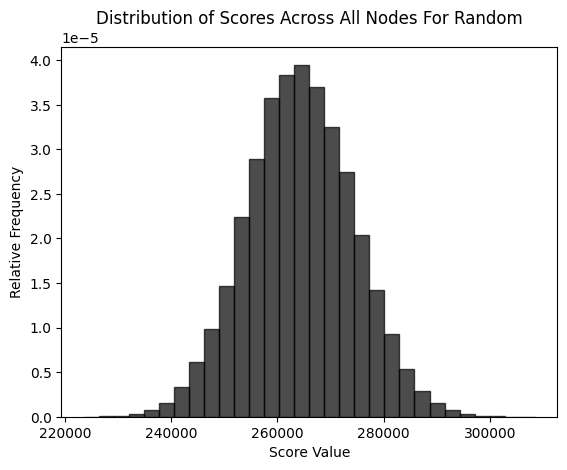

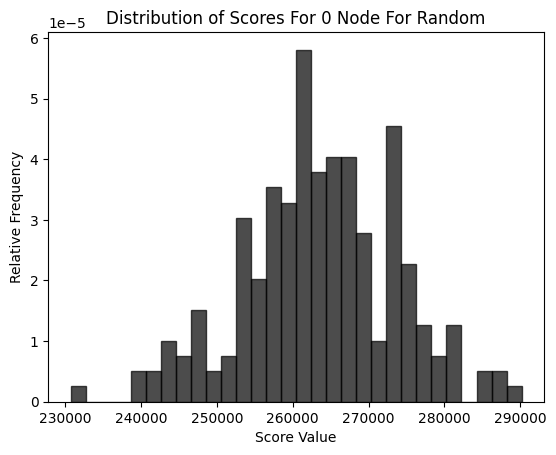

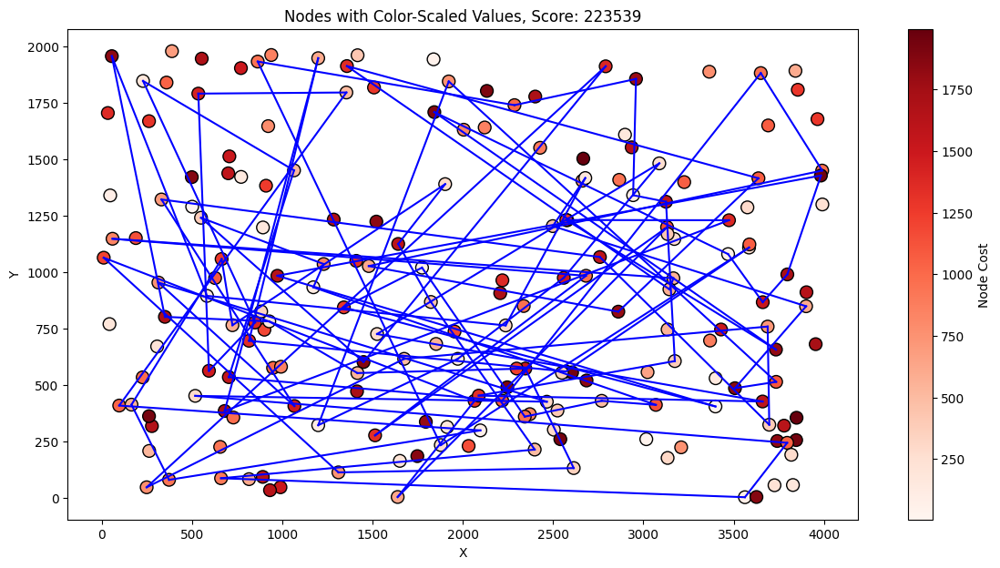

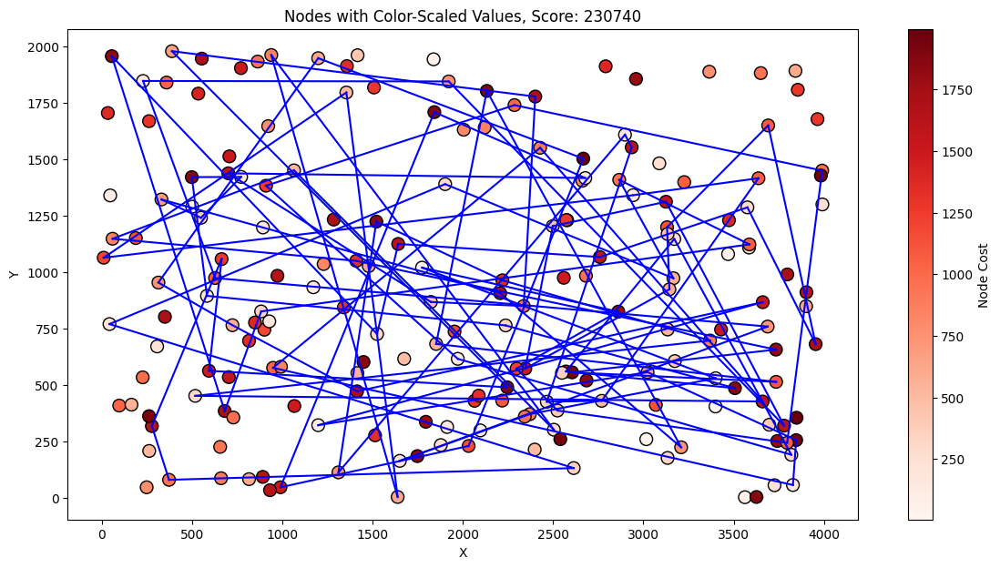

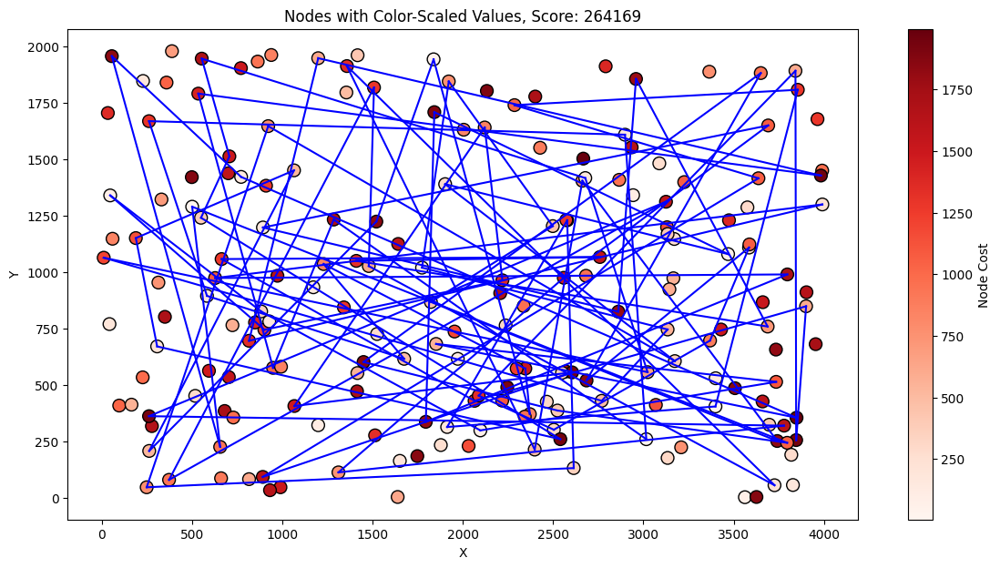

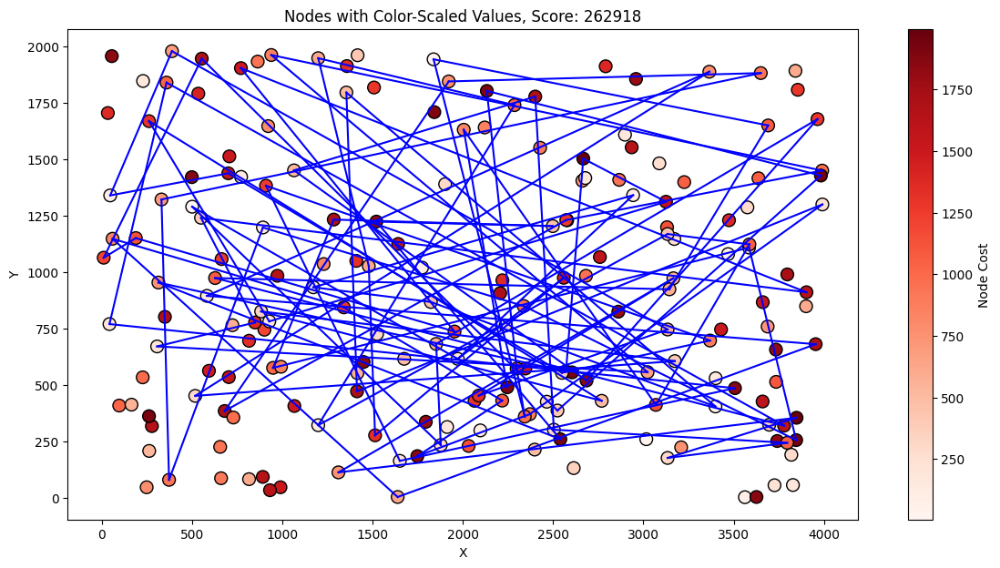

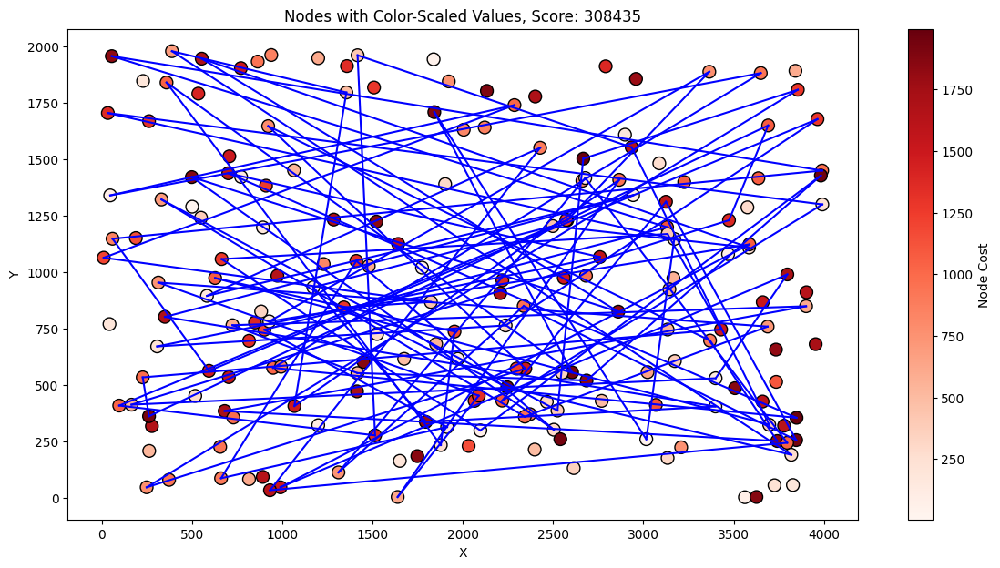

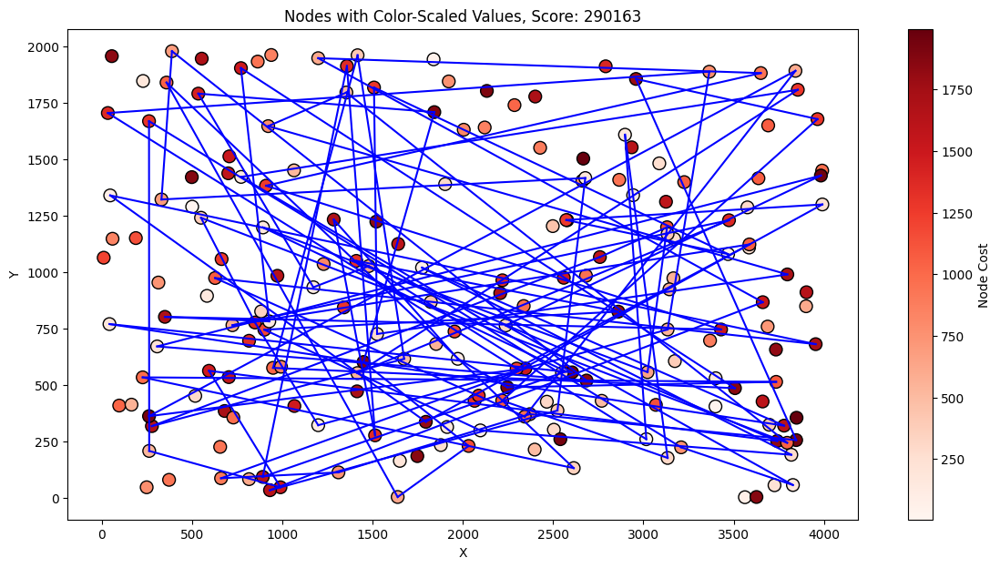

Overall Stats: 
 Minimum: 223539 Maximum: 308435 Median: 264169.0 Mean: 264301.22975 Standard Deviation: 10007.909240621386
Node stats for node 0 Stats: 
 Minimum: 230740 Maximum: 290163 Median: 262902.5 Mean: 263535.725 Standard Deviation: 10165.445576529097


In [33]:
plot_score_distribution(random_results_A, label="Random")
plot_distribution_node(random_results_A, node=0, label="Random")
plot_best_overall(df_A, random_solutions_A, random_results_A)
plot_best_for_node(df_A, random_solutions_A, random_results_A, node=0)
plot_average_overall(df_A, random_solutions_A, random_results_A)
plot_average_for_node(df_A, random_solutions_A, random_results_A, node=0)
plot_worst_overall(df_A, random_solutions_A, random_results_A)
plot_worst_for_node(df_A, random_solutions_A, random_results_A, node=0)
min_value, max_value, median_value, mean_value, std_deviation = calculate_stats_overall(random_results_A)
print(f"Overall Stats: \n Minimum: {min_value} Maximum: {max_value} Median: {median_value} Mean: {mean_value} Standard Deviation: {std_deviation}")
min_value, max_value, median_value, mean_value, std_deviation = calculate_stats_node(random_results_A, node=0)
print(f"Node stats for node {0} Stats: \n Minimum: {min_value} Maximum: {max_value} Median: {median_value} Mean: {mean_value} Standard Deviation: {std_deviation}")

### Nearest Neighbor - Added to The End

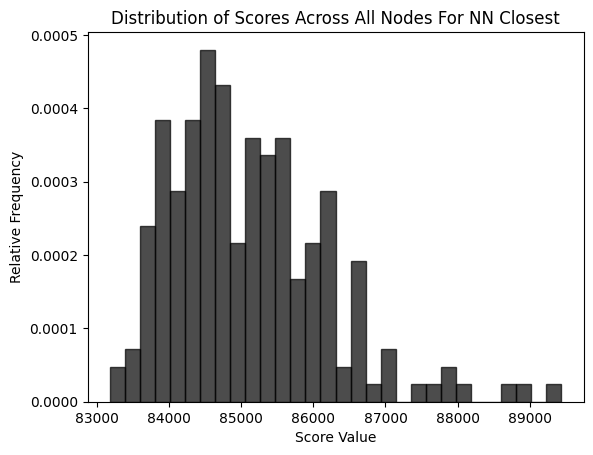

___________________________________________________________________
For Node: 124


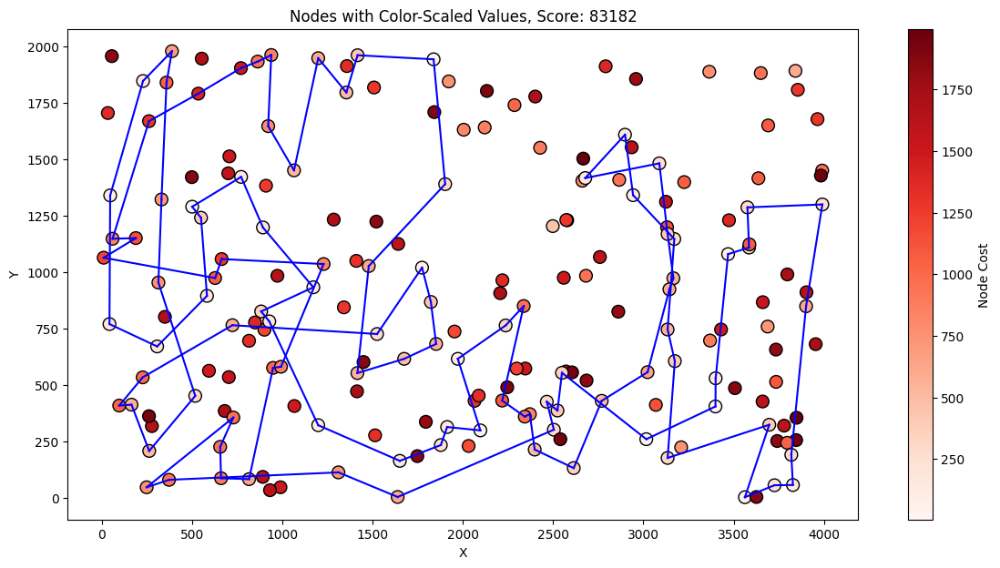

Plotting Node: 0


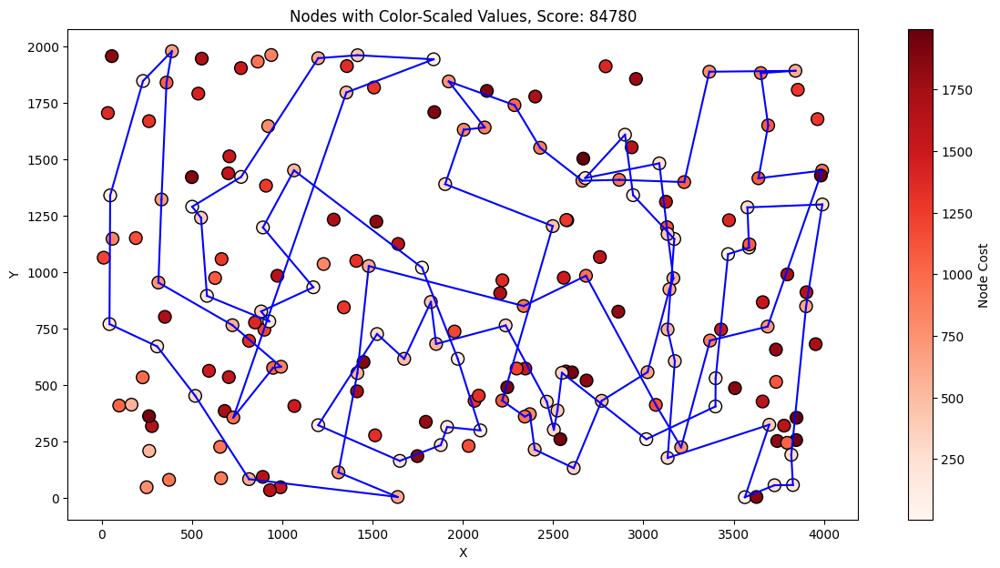

___________________________________________________________________
For Node: 8


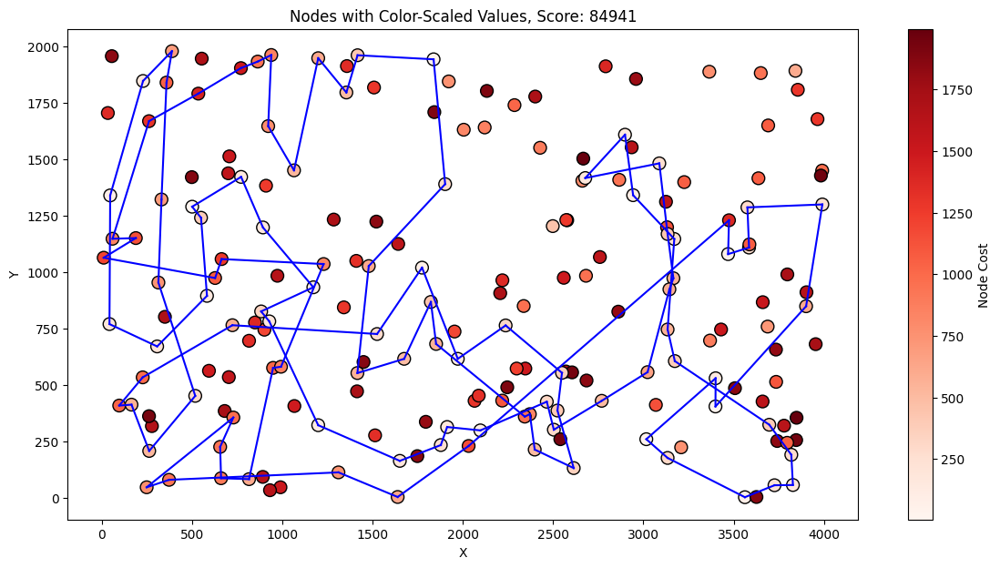

___________________________________________________________________
For Node: 30


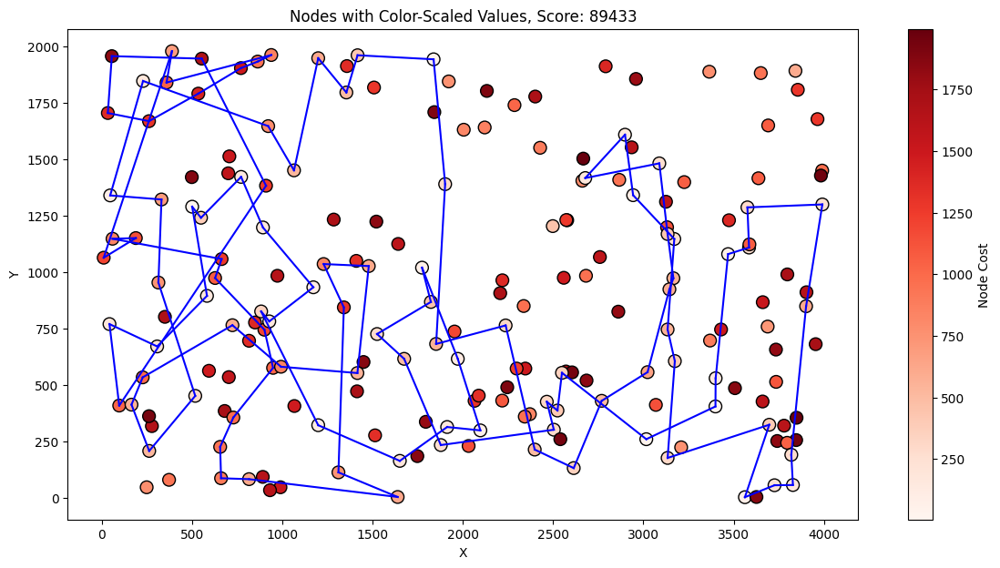

Overall Stats: 
 Minimum: 83182 Maximum: 89433 Median: 84923.5 Mean: 85108.51 Standard Deviation: 1084.7714413184005


In [34]:
plot_score_distribution_not_random(nn_closest_results_A, label="NN Closest")
plot_best_overall_not_random(df_A, nn_closest_solutions_A, nn_closest_results_A)
plot_node(df_A, nn_closest_results_A, nn_closest_solutions_A, node=0)
plot_average_overall_not_random(df_A, nn_closest_solutions_A, nn_closest_results_A)
plot_worst_overall_not_random(df_A, nn_closest_solutions_A, nn_closest_results_A)
min_value, max_value, median_value, mean_value, std_deviation = calculate_stats_overall_not_random(nn_closest_results_A)
print(f"Overall Stats: \n Minimum: {min_value} Maximum: {max_value} Median: {median_value} Mean: {mean_value} Standard Deviation: {std_deviation}")

### Nearest Neighbor - All Considered

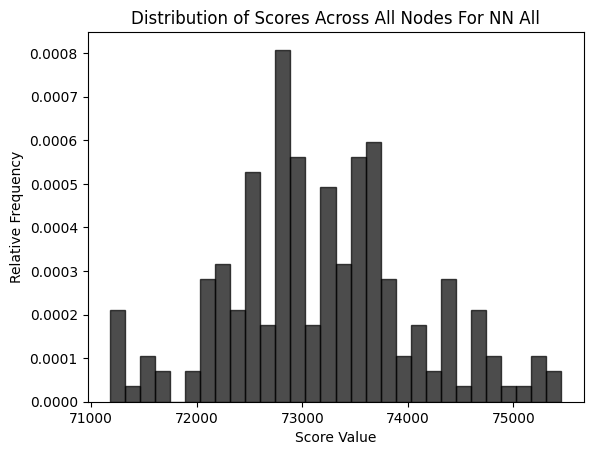

___________________________________________________________________
For Node: 43


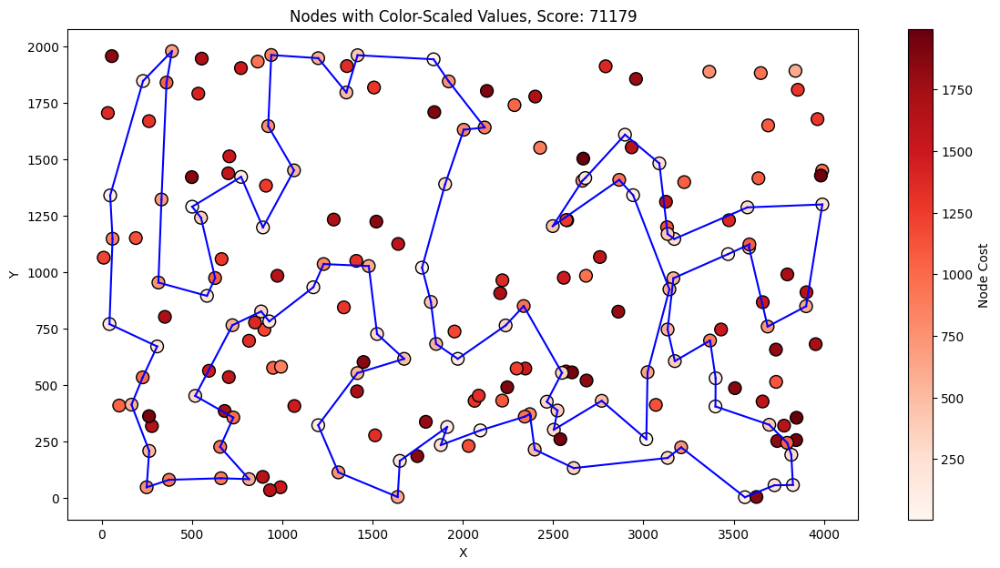

Plotting Node: 0


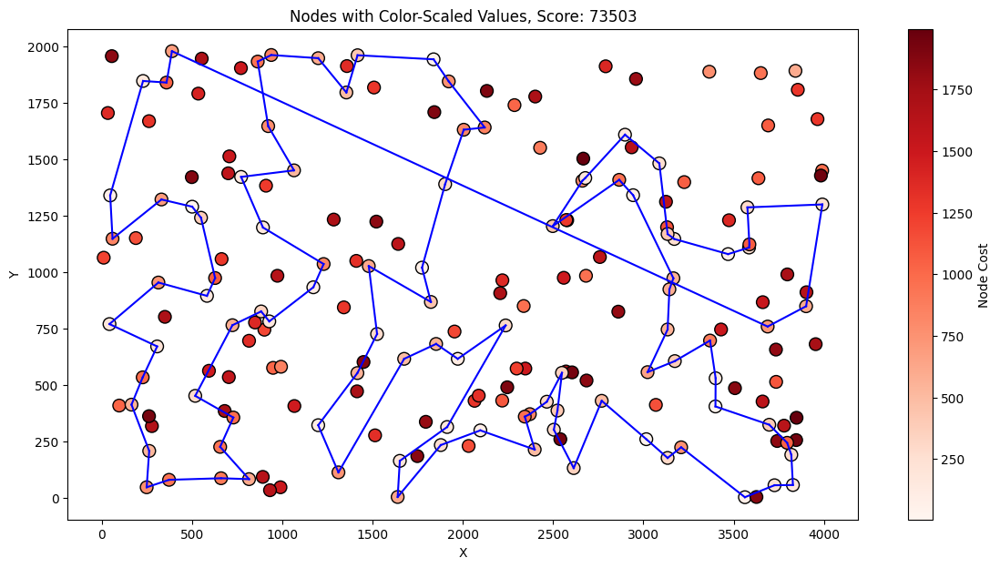

___________________________________________________________________
For Node: 39


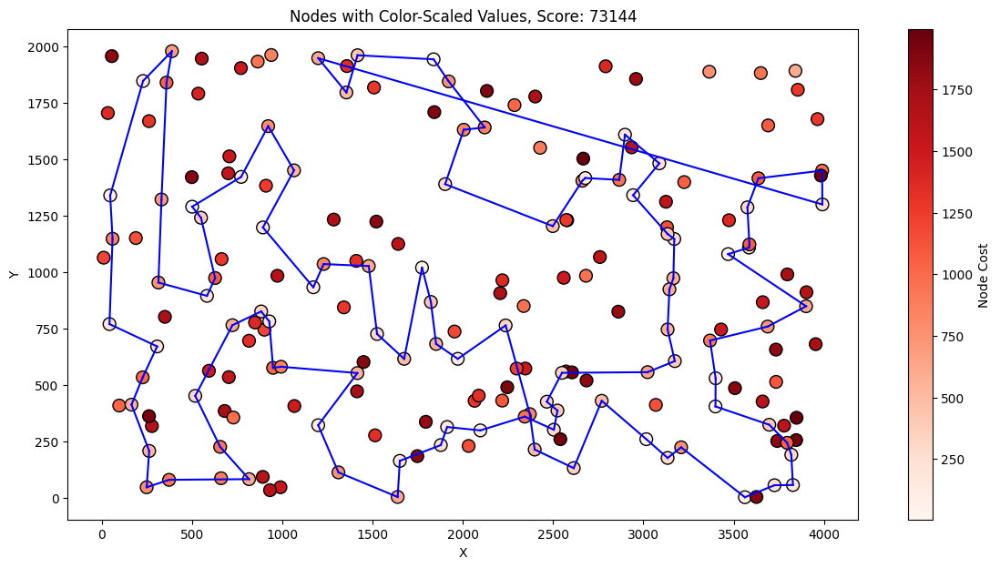

___________________________________________________________________
For Node: 13


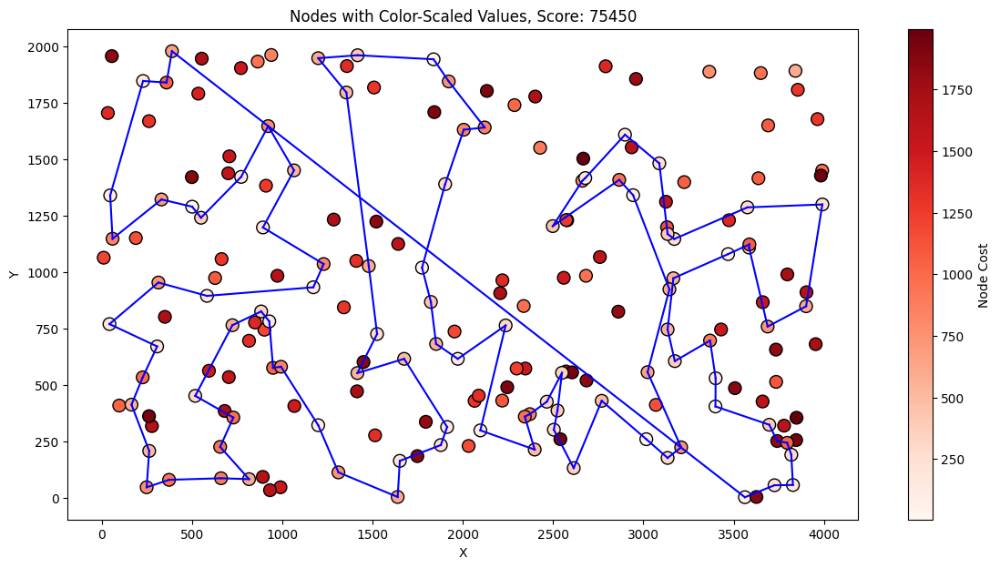

Overall Stats: 
 Minimum: 71179 Maximum: 75450 Median: 73142.0 Mean: 73180.365 Standard Deviation: 888.1766500955765


In [35]:
plot_score_distribution_not_random(nn_all_results_A, label="NN All")
plot_best_overall_not_random(df_A, nn_all_solutions_A, nn_all_results_A)
plot_node(df_A, nn_all_results_A, nn_all_solutions_A, node=0)
plot_average_overall_not_random(df_A, nn_all_solutions_A, nn_all_results_A)
plot_worst_overall_not_random(df_A, nn_all_solutions_A, nn_all_results_A)
min_value, max_value, median_value, mean_value, std_deviation = calculate_stats_overall_not_random(nn_all_results_A)
print(f"Overall Stats: \n Minimum: {min_value} Maximum: {max_value} Median: {median_value} Mean: {mean_value} Standard Deviation: {std_deviation}")

### Greedy Cycle

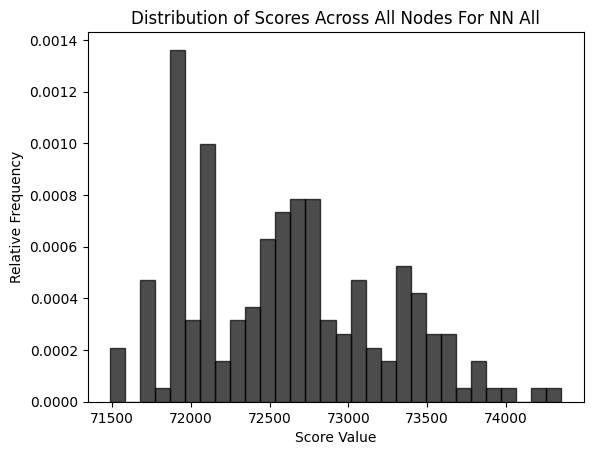

___________________________________________________________________
For Node: 0


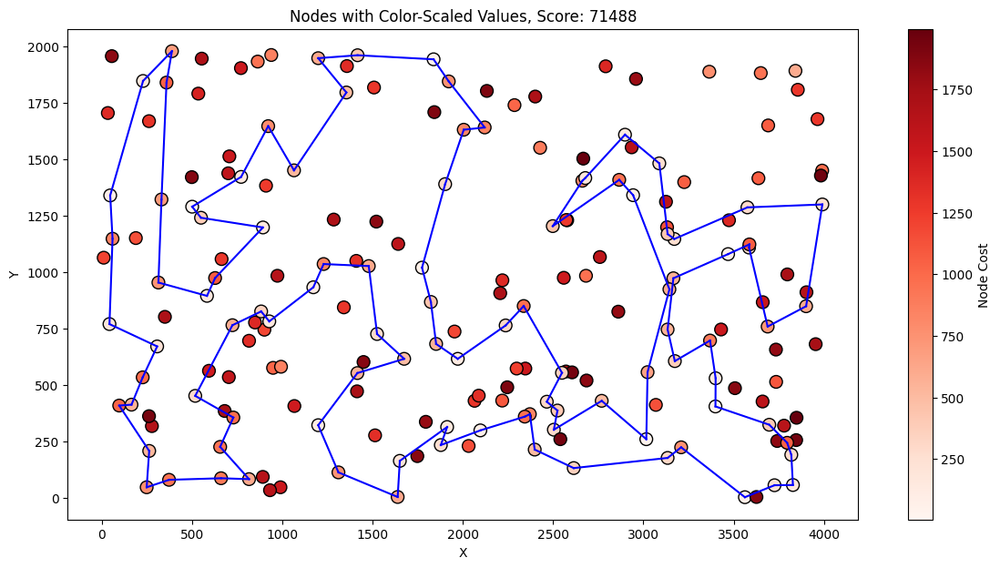

Plotting Node: 0


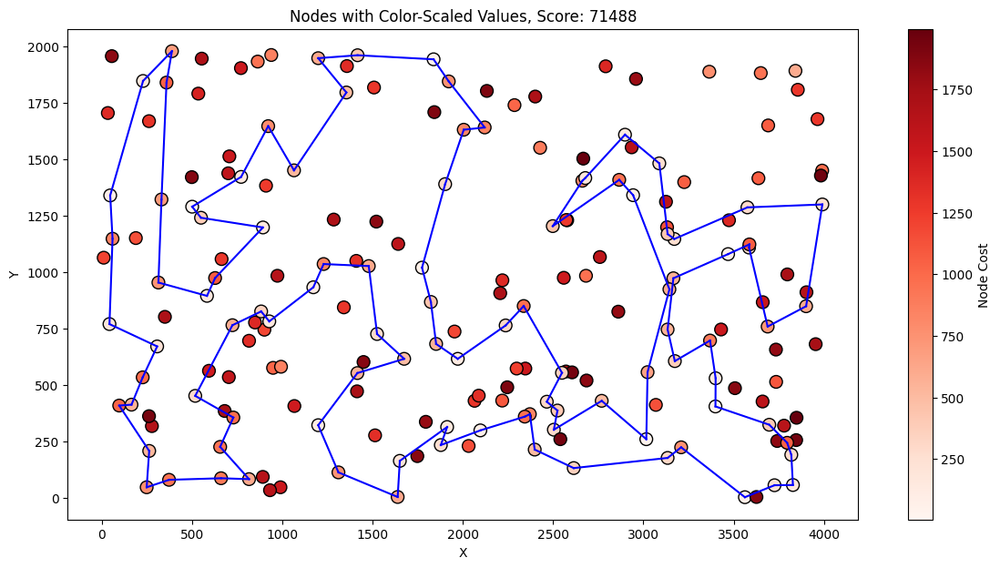

___________________________________________________________________
For Node: 20


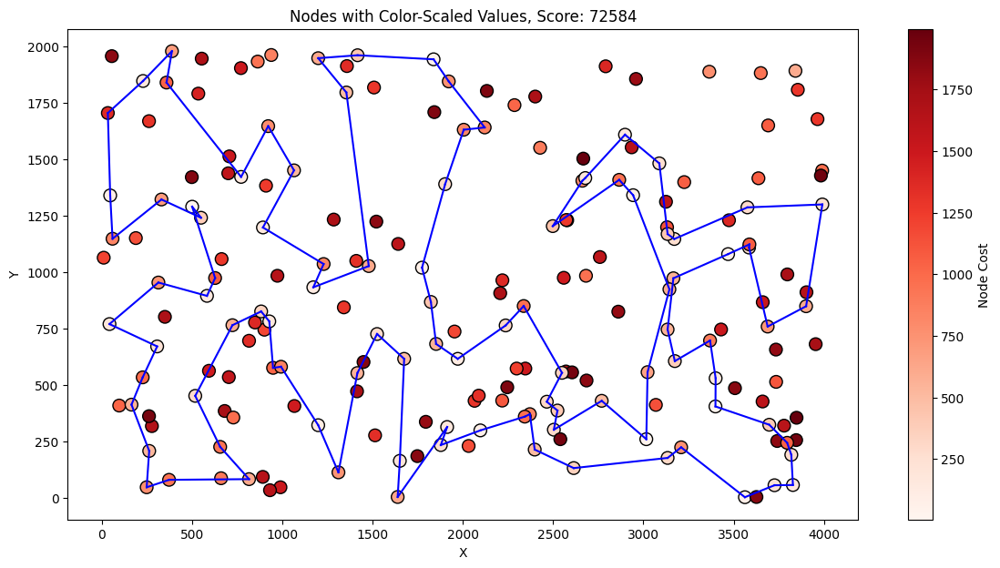

___________________________________________________________________
For Node: 50


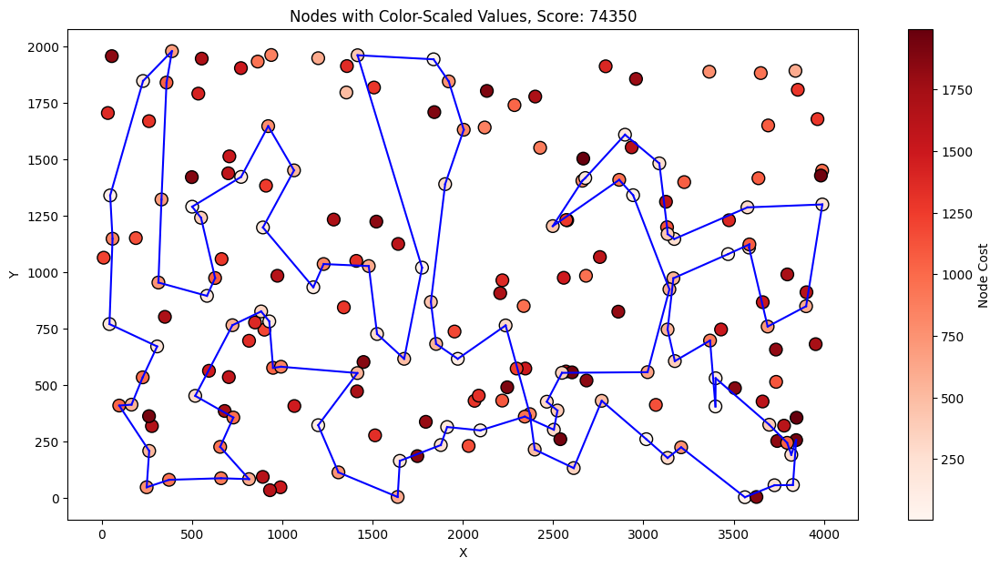

Overall Stats: 
 Minimum: 71488 Maximum: 74350 Median: 72572.5 Mean: 72605.865 Standard Deviation: 609.0561688177864


In [37]:
plot_score_distribution_not_random(cycle_results_A, label="NN All")
plot_best_overall_not_random(df_A, cycle_solutions_A, cycle_results_A)
plot_node(df_A, cycle_results_A, cycle_solutions_A, node=0)
plot_average_overall_not_random(df_A, cycle_solutions_A, cycle_results_A)
plot_worst_overall_not_random(df_A, cycle_solutions_A, cycle_results_A)
min_value, max_value, median_value, mean_value, std_deviation = calculate_stats_overall_not_random(cycle_results_A)
print(f"Overall Stats: \n Minimum: {min_value} Maximum: {max_value} Median: {median_value} Mean: {mean_value} Standard Deviation: {std_deviation}")

### All

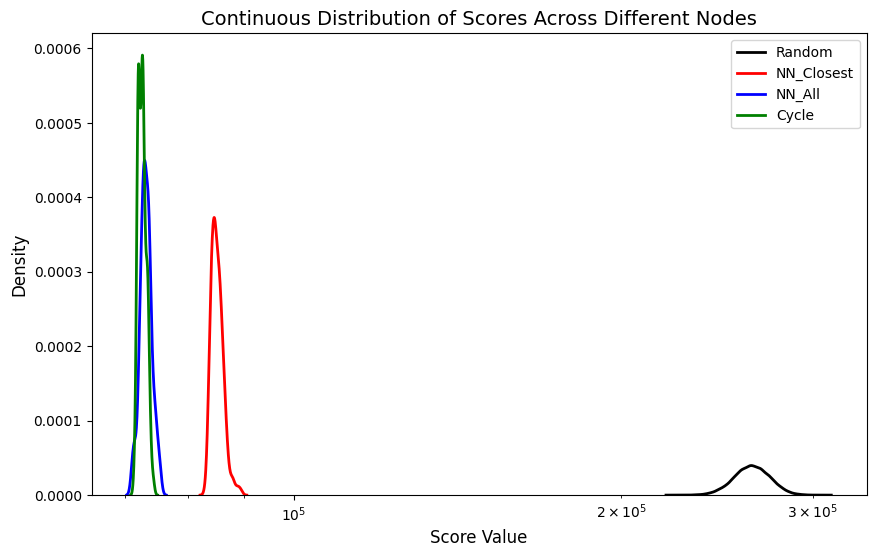

In [38]:
plot_score_distributions(random_results_A, nn_closest_results_A, nn_all_results_A, cycle_results_A, ["Random", "NN_Closest", "NN_All", "Cycle"])

In [39]:
comparison_random, comparison_nn_next, comparison_nn_all, comparison_cycle, total_results = summarize_results(random_results_A, nn_closest_results_A, nn_all_results_A, cycle_results_A)
comparison_random

,0,1,2,3,4,5,6,7,8,9,...,190,191,192,193,194,195,196,197,198,199
Best Score:,230740.000,239996.00,240740.000,233830.00,232601.00,228621.00,236012.00,239658.00,238913.000,234837.00,...,244256.000,242235.00,241367.00,244174.000,234689.00,237682.00,237970.000,245405.000,234306.00,235146.000
Worst Score:,290163.000,290804.00,294230.000,290724.00,288373.00,290125.00,302144.00,291418.00,293522.000,293391.00,...,297082.000,290959.00,293528.00,292425.000,290725.00,291049.00,294570.000,297265.000,295285.00,292155.000
Median Score:,262902.500,263536.00,264882.000,264019.00,263460.00,263385.00,263700.50,263557.00,265283.000,264296.00,...,263721.000,265732.50,264447.00,265091.000,263924.50,264669.00,264089.500,266818.000,264496.00,265983.500
Average Score,263535.725,263775.12,264473.985,263635.94,263550.21,263982.92,264417.52,264308.82,264842.855,264088.24,...,264337.565,265852.58,264458.42,264979.515,264393.25,264189.15,264853.755,266804.295,264344.54,265164.455


In [40]:
comparison_nn_next

,0,1,2,3,4,5,6,7,8,9,...,190,191,192,193,194,195,196,197,198,199
Best Score:,84780.0,84037.0,84180.0,84539.0,85555.0,88080.0,87351.0,85482.0,84941.0,84010.0,...,85891.0,85192.0,87010.0,85663.0,86673.0,86672.0,84501.0,84750.0,84745.0,86462.0
Worst Score:,84780.0,84037.0,84180.0,84539.0,85555.0,88080.0,87351.0,85482.0,84941.0,84010.0,...,85891.0,85192.0,87010.0,85663.0,86673.0,86672.0,84501.0,84750.0,84745.0,86462.0
Median Score:,84780.0,84037.0,84180.0,84539.0,85555.0,88080.0,87351.0,85482.0,84941.0,84010.0,...,85891.0,85192.0,87010.0,85663.0,86673.0,86672.0,84501.0,84750.0,84745.0,86462.0
Average Score,84780.0,84037.0,84180.0,84539.0,85555.0,88080.0,87351.0,85482.0,84941.0,84010.0,...,85891.0,85192.0,87010.0,85663.0,86673.0,86672.0,84501.0,84750.0,84745.0,86462.0


In [41]:
comparison_nn_all

,0,1,2,3,4,5,6,7,8,9,...,190,191,192,193,194,195,196,197,198,199
Best Score:,73503.0,73697.0,73846.0,72916.0,73571.0,72779.0,73756.0,72493.0,73191.0,72169.0,...,73940.0,72723.0,73845.0,72207.0,73424.0,72289.0,73704.0,71925.0,72476.0,72457.0
Worst Score:,73503.0,73697.0,73846.0,72916.0,73571.0,72779.0,73756.0,72493.0,73191.0,72169.0,...,73940.0,72723.0,73845.0,72207.0,73424.0,72289.0,73704.0,71925.0,72476.0,72457.0
Median Score:,73503.0,73697.0,73846.0,72916.0,73571.0,72779.0,73756.0,72493.0,73191.0,72169.0,...,73940.0,72723.0,73845.0,72207.0,73424.0,72289.0,73704.0,71925.0,72476.0,72457.0
Average Score,73503.0,73697.0,73846.0,72916.0,73571.0,72779.0,73756.0,72493.0,73191.0,72169.0,...,73940.0,72723.0,73845.0,72207.0,73424.0,72289.0,73704.0,71925.0,72476.0,72457.0


In [42]:
comparison_cycle

,0,1,2,3,4,5,6,7,8,9,...,190,191,192,193,194,195,196,197,198,199
Best Score:,71488.0,72752.0,72639.0,72238.0,71761.0,71891.0,73061.0,73373.0,72839.0,71948.0,...,72475.0,72772.0,72507.0,72081.0,72834.0,71868.0,71901.0,72985.0,72350.0,72629.0
Worst Score:,71488.0,72752.0,72639.0,72238.0,71761.0,71891.0,73061.0,73373.0,72839.0,71948.0,...,72475.0,72772.0,72507.0,72081.0,72834.0,71868.0,71901.0,72985.0,72350.0,72629.0
Median Score:,71488.0,72752.0,72639.0,72238.0,71761.0,71891.0,73061.0,73373.0,72839.0,71948.0,...,72475.0,72772.0,72507.0,72081.0,72834.0,71868.0,71901.0,72985.0,72350.0,72629.0
Average Score,71488.0,72752.0,72639.0,72238.0,71761.0,71891.0,73061.0,73373.0,72839.0,71948.0,...,72475.0,72772.0,72507.0,72081.0,72834.0,71868.0,71901.0,72985.0,72350.0,72629.0


In [43]:
total_results

,0,1,2,3,4,5,6,7,8,9,...,190,191,192,193,194,195,196,197,198,199
Best Maximum Score,Greedy Cycle,Greedy Cycle,Greedy Cycle,Greedy Cycle,Greedy Cycle,Greedy Cycle,Greedy Cycle,NN All,Greedy Cycle,Greedy Cycle,...,Greedy Cycle,NN All,Greedy Cycle,Greedy Cycle,Greedy Cycle,Greedy Cycle,Greedy Cycle,NN All,Greedy Cycle,NN All
Best Minimum Score,Greedy Cycle,Greedy Cycle,Greedy Cycle,Greedy Cycle,Greedy Cycle,Greedy Cycle,Greedy Cycle,NN All,Greedy Cycle,Greedy Cycle,...,Greedy Cycle,NN All,Greedy Cycle,Greedy Cycle,Greedy Cycle,Greedy Cycle,Greedy Cycle,NN All,Greedy Cycle,NN All
Best Average Score,Greedy Cycle,Greedy Cycle,Greedy Cycle,Greedy Cycle,Greedy Cycle,Greedy Cycle,Greedy Cycle,NN All,Greedy Cycle,Greedy Cycle,...,Greedy Cycle,NN All,Greedy Cycle,Greedy Cycle,Greedy Cycle,Greedy Cycle,Greedy Cycle,NN All,Greedy Cycle,NN All
Best Median Score,Greedy Cycle,Greedy Cycle,Greedy Cycle,Greedy Cycle,Greedy Cycle,Greedy Cycle,Greedy Cycle,NN All,Greedy Cycle,Greedy Cycle,...,Greedy Cycle,NN All,Greedy Cycle,Greedy Cycle,Greedy Cycle,Greedy Cycle,Greedy Cycle,NN All,Greedy Cycle,NN All


## Results - Instance B

### Random

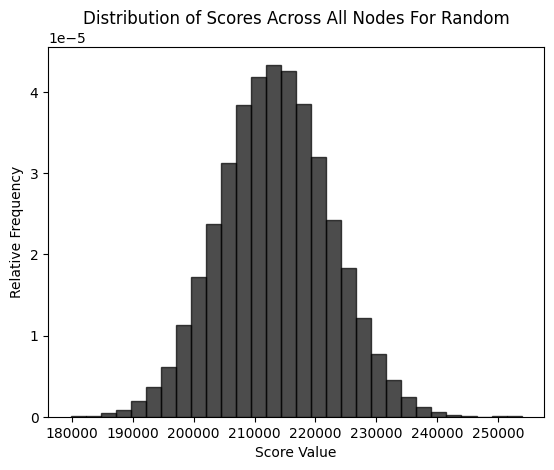

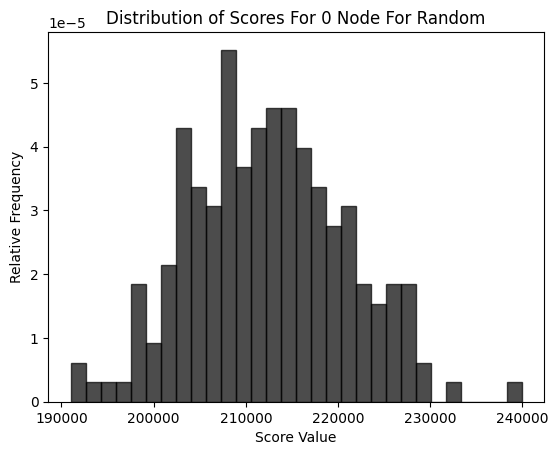

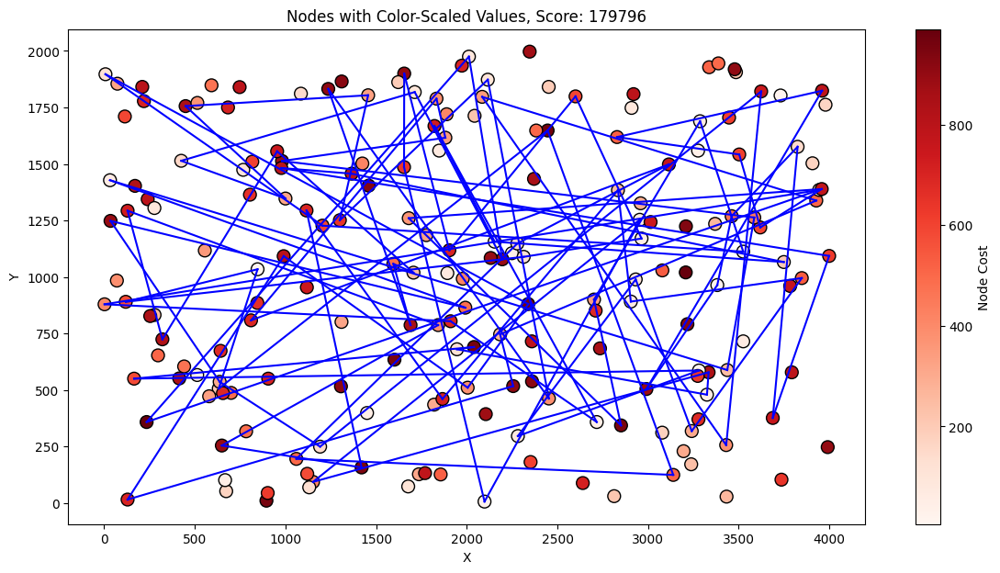

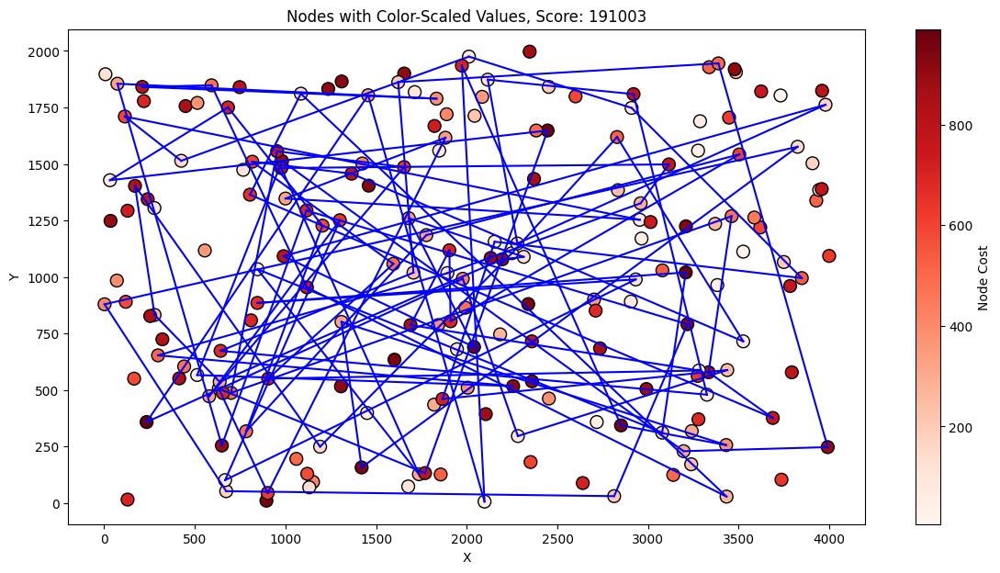

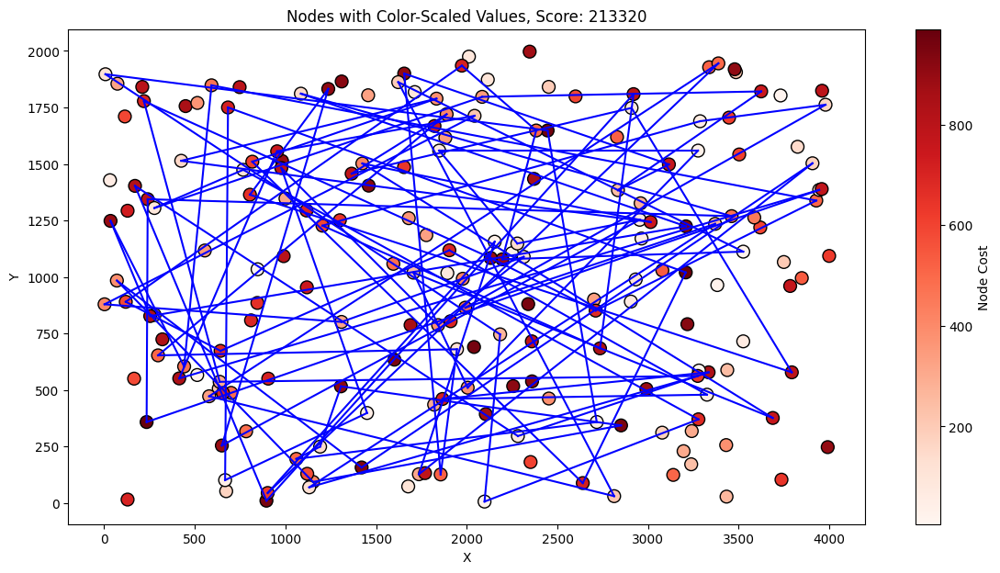

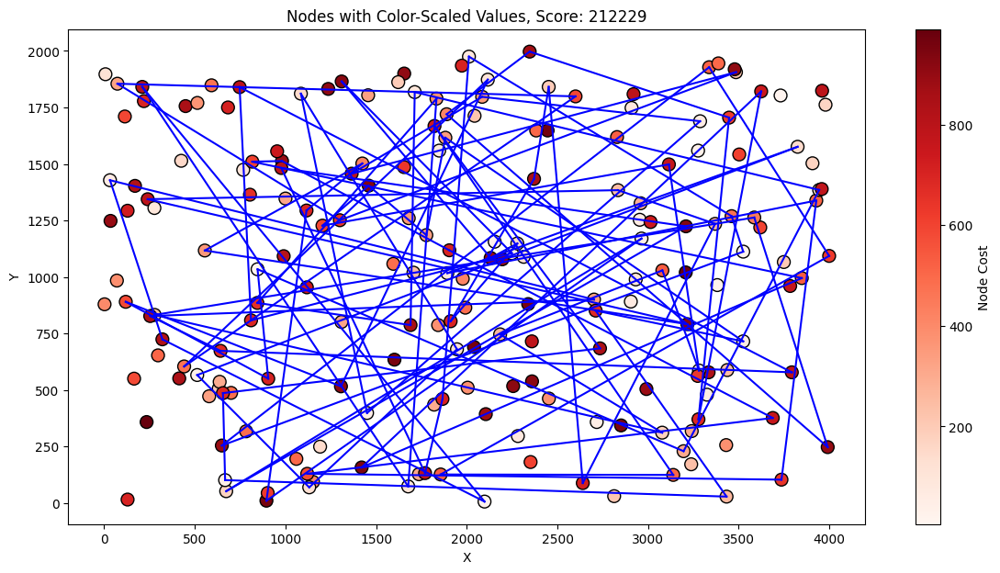

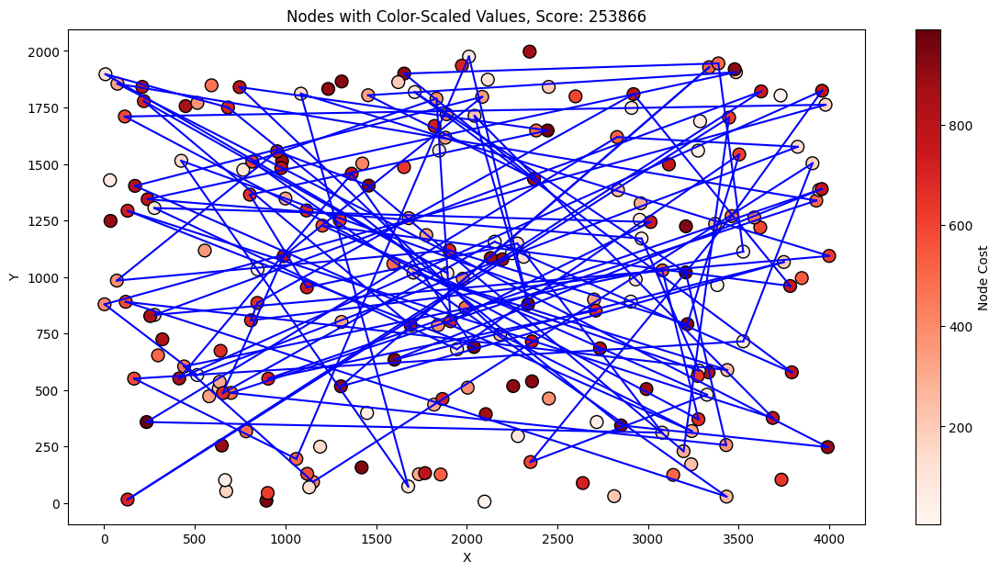

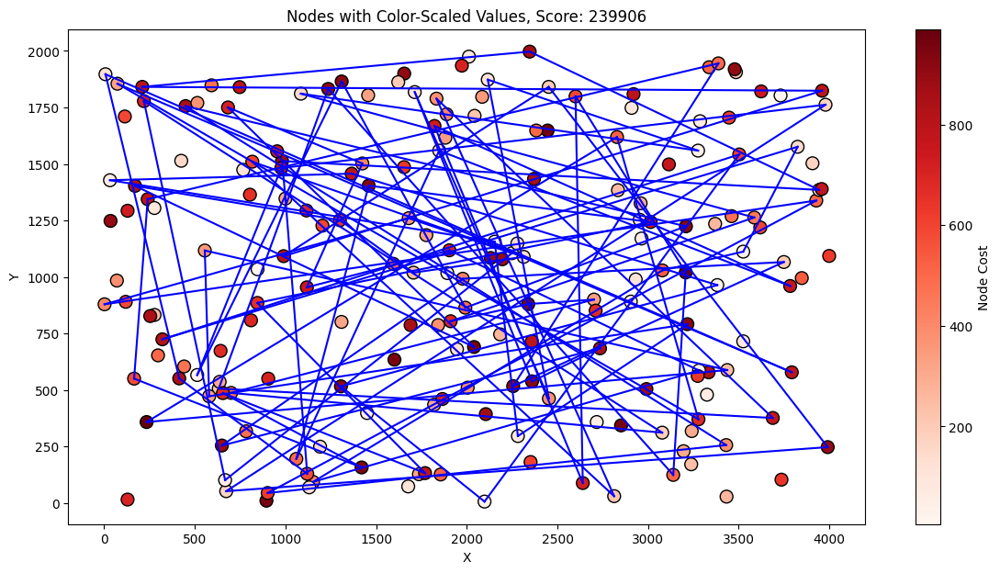

Overall Stats: 
 Minimum: 179796 Maximum: 253866 Median: 213320.0 Mean: 213397.4125 Standard Deviation: 9016.616608287377
Node stats for node 0 Stats: 
 Minimum: 191003 Maximum: 239906 Median: 212176.5 Mean: 212393.0 Standard Deviation: 8481.237411486605


In [44]:
plot_score_distribution(random_results_B, label="Random")
plot_distribution_node(random_results_B, node=0, label="Random")
plot_best_overall(df_B, random_solutions_B, random_results_B)
plot_best_for_node(df_B, random_solutions_B, random_results_B, node=0)
plot_average_overall(df_B, random_solutions_B, random_results_B)
plot_average_for_node(df_B, random_solutions_B, random_results_B, node=0)
plot_worst_overall(df_B, random_solutions_B, random_results_B)
plot_worst_for_node(df_B, random_solutions_B, random_results_B, node=0)
min_value, max_value, median_value, mean_value, std_deviation = calculate_stats_overall(random_results_B)
print(f"Overall Stats: \n Minimum: {min_value} Maximum: {max_value} Median: {median_value} Mean: {mean_value} Standard Deviation: {std_deviation}")
min_value, max_value, median_value, mean_value, std_deviation = calculate_stats_node(random_results_B, node=0)
print(f"Node stats for node {0} Stats: \n Minimum: {min_value} Maximum: {max_value} Median: {median_value} Mean: {mean_value} Standard Deviation: {std_deviation}")

### Nearest Neighbor - Added to The End

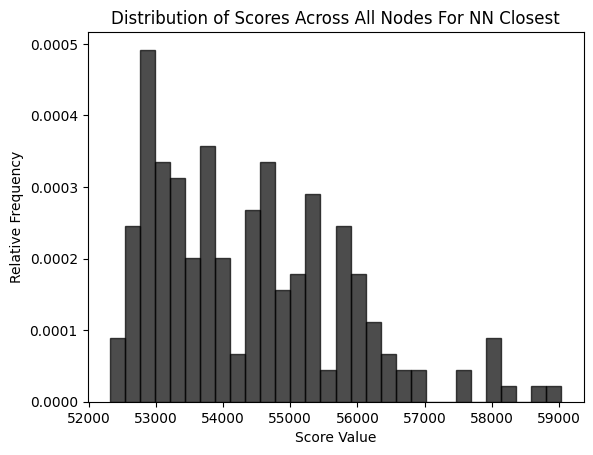

___________________________________________________________________
For Node: 16


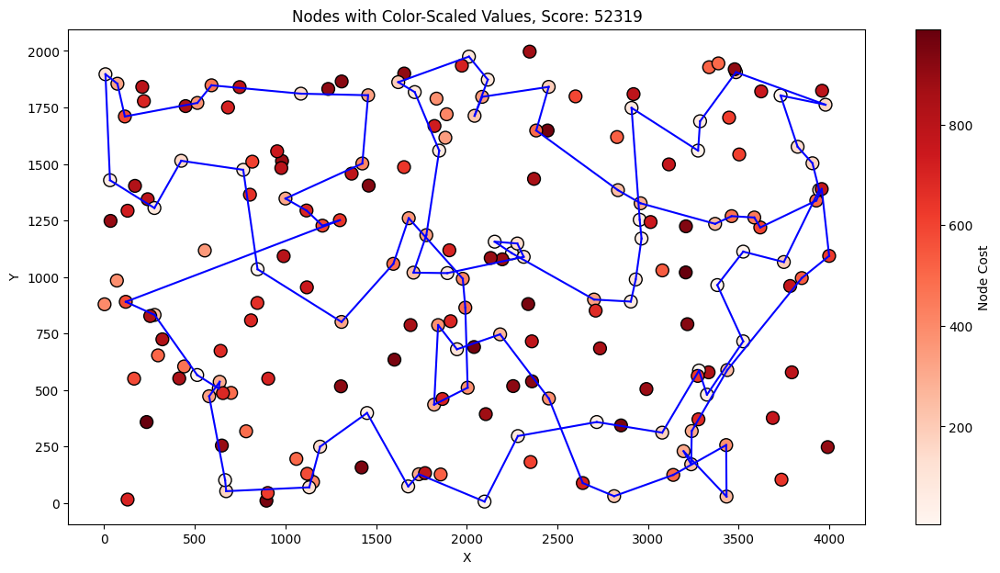

Plotting Node: 0


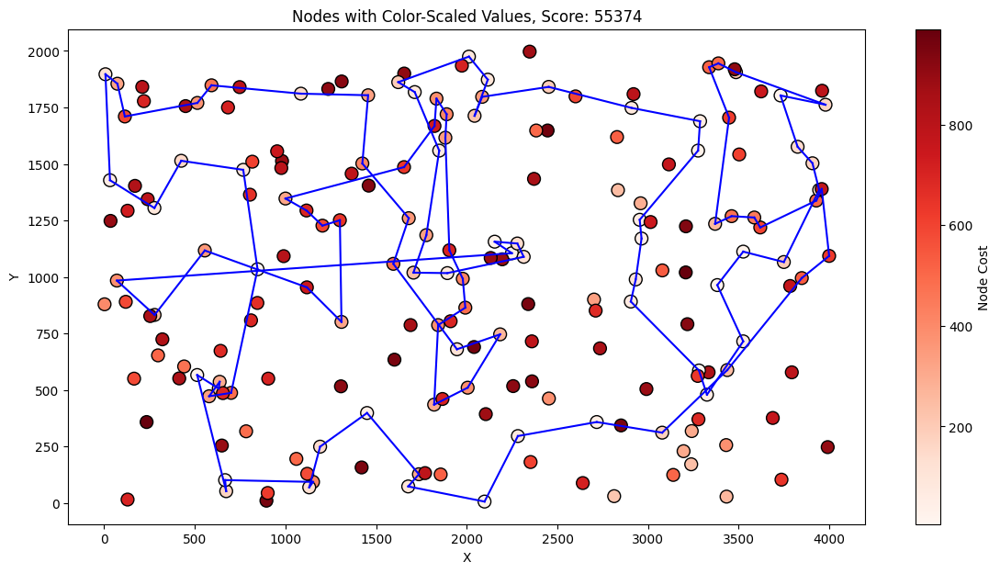

___________________________________________________________________
For Node: 70


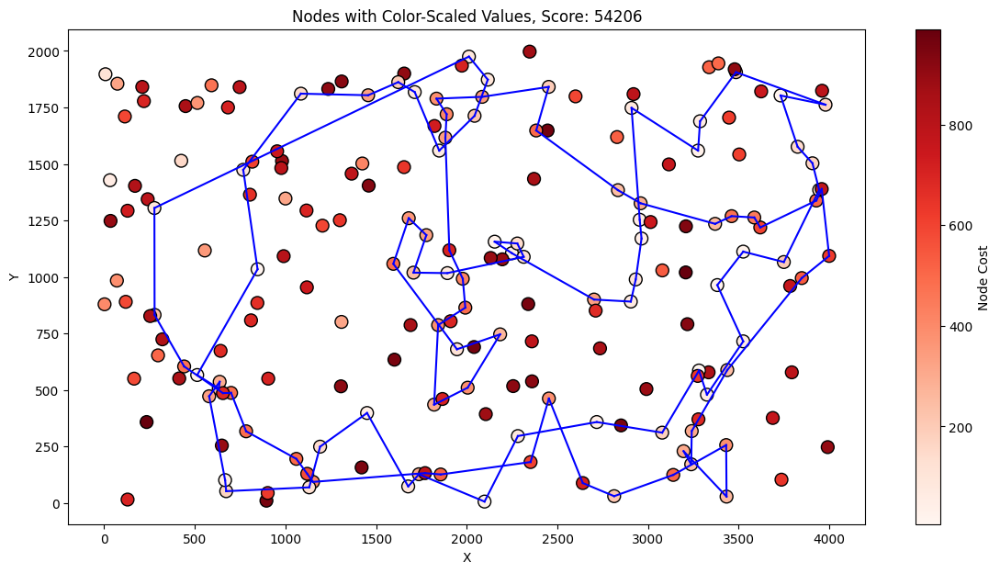

___________________________________________________________________
For Node: 34


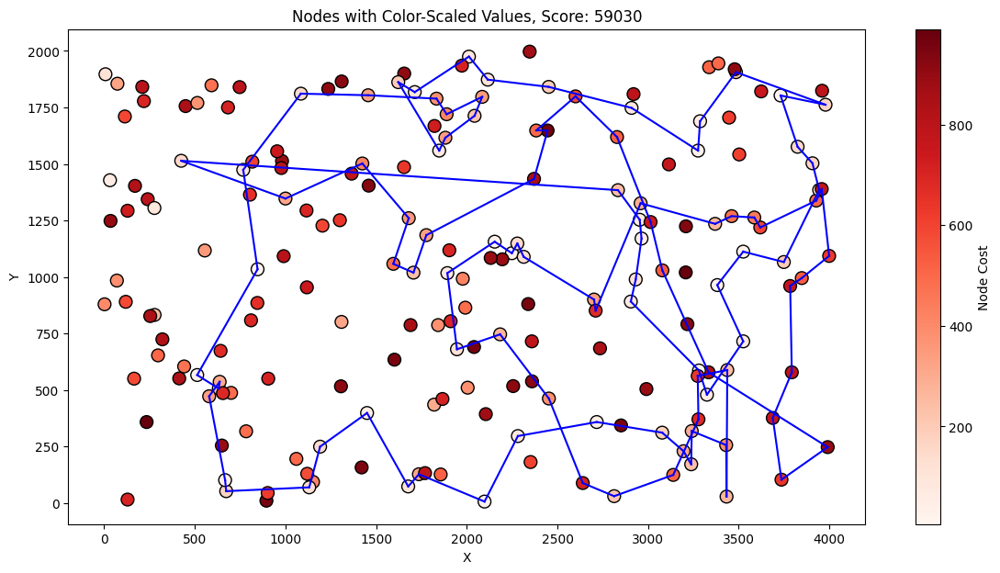

Overall Stats: 
 Minimum: 52319 Maximum: 59030 Median: 54147.0 Mean: 54390.43 Standard Deviation: 1418.590457143992


In [45]:
plot_score_distribution_not_random(nn_closest_results_B, label="NN Closest")
plot_best_overall_not_random(df_B, nn_closest_solutions_B, nn_closest_results_B)
plot_node(df_B, nn_closest_results_B, nn_closest_solutions_B, node=0)
plot_average_overall_not_random(df_B, nn_closest_solutions_B, nn_closest_results_B)
plot_worst_overall_not_random(df_B, nn_closest_solutions_B, nn_closest_results_B)
min_value, max_value, median_value, mean_value, std_deviation = calculate_stats_overall_not_random(nn_closest_results_B)
print(f"Overall Stats: \n Minimum: {min_value} Maximum: {max_value} Median: {median_value} Mean: {mean_value} Standard Deviation: {std_deviation}")

### Nearest Neighbor - All Considered

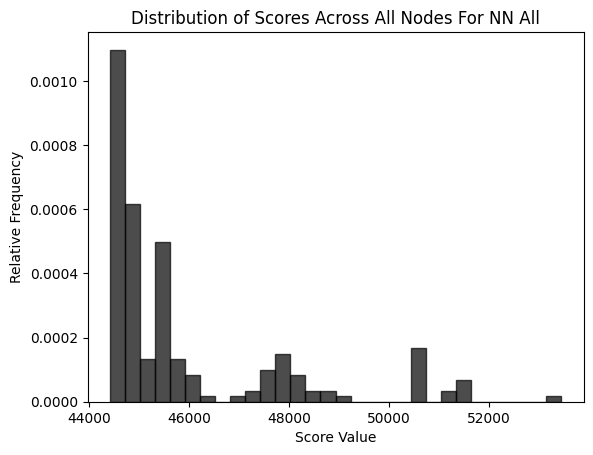

___________________________________________________________________
For Node: 193


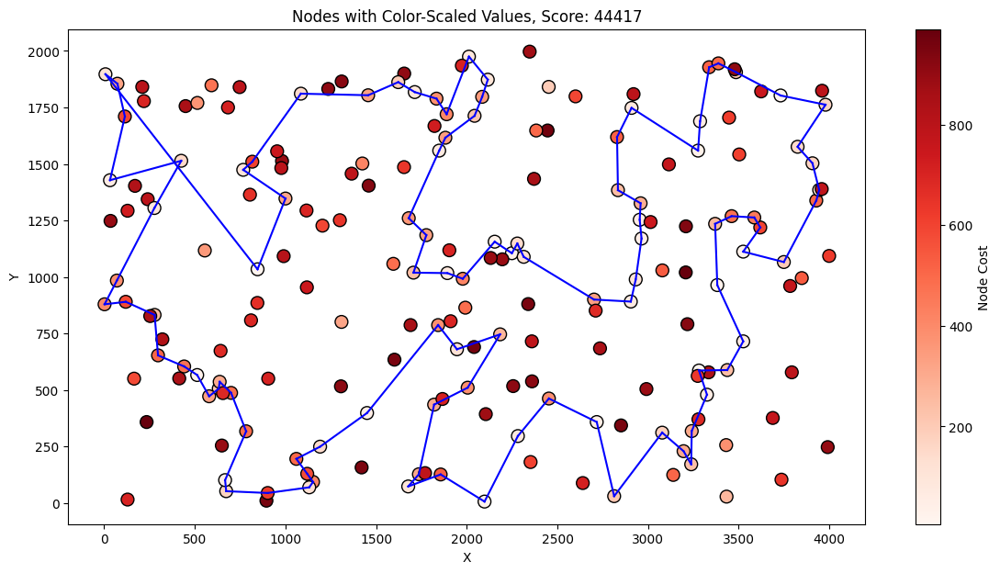

Plotting Node: 0


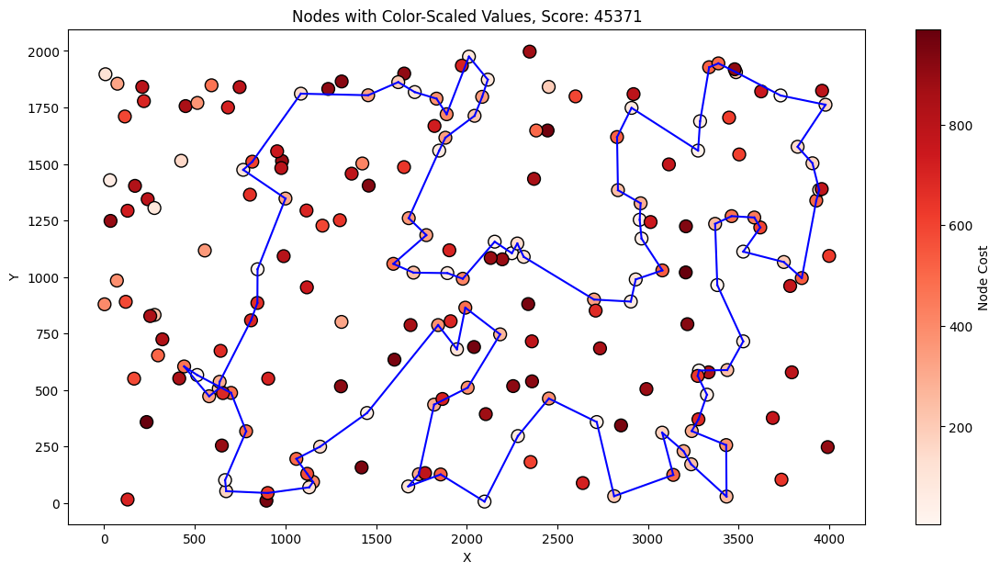

___________________________________________________________________
For Node: 17


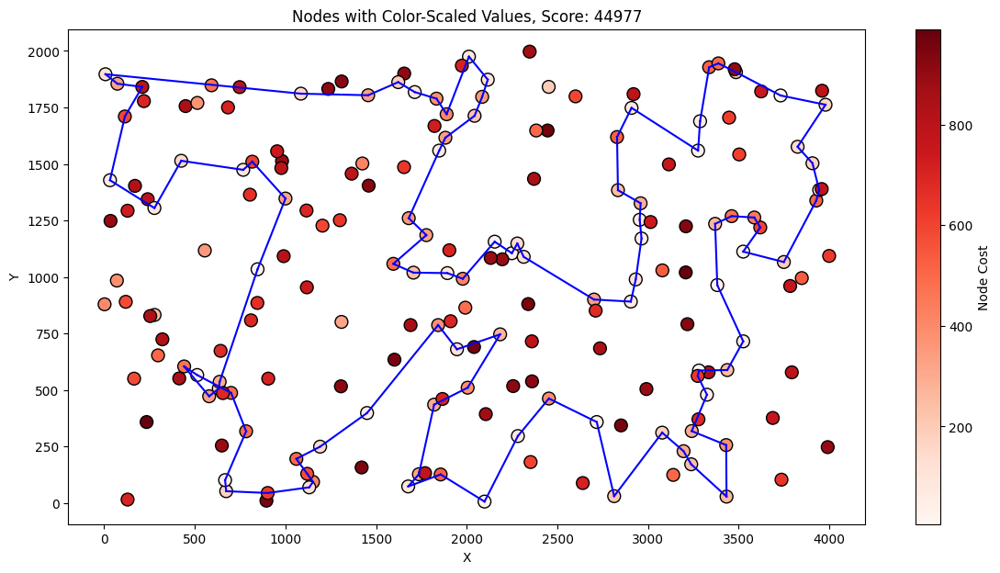

___________________________________________________________________
For Node: 108


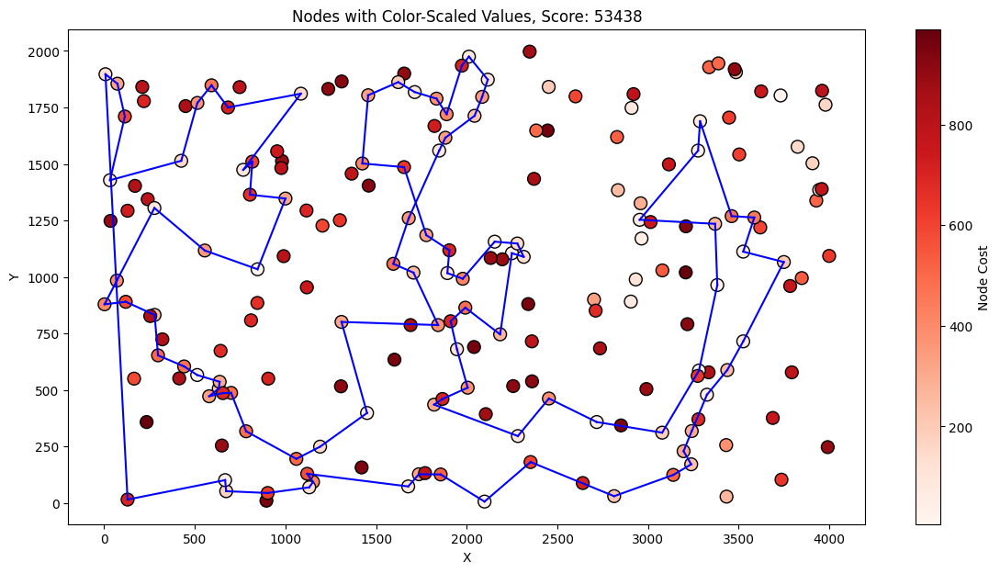

Overall Stats: 
 Minimum: 44417 Maximum: 53438 Median: 44965.0 Mean: 45870.255 Standard Deviation: 1944.626241717158


In [46]:
plot_score_distribution_not_random(nn_all_results_B, label="NN All")
plot_best_overall_not_random(df_B, nn_all_solutions_B, nn_all_results_B)
plot_node(df_B, nn_all_results_B, nn_all_solutions_B, node=0)
plot_average_overall_not_random(df_B, nn_all_solutions_B, nn_all_results_B)
plot_worst_overall_not_random(df_B, nn_all_solutions_B, nn_all_results_B)
min_value, max_value, median_value, mean_value, std_deviation = calculate_stats_overall_not_random(nn_all_results_B)
print(f"Overall Stats: \n Minimum: {min_value} Maximum: {max_value} Median: {median_value} Mean: {mean_value} Standard Deviation: {std_deviation}")

### Greedy Cycle

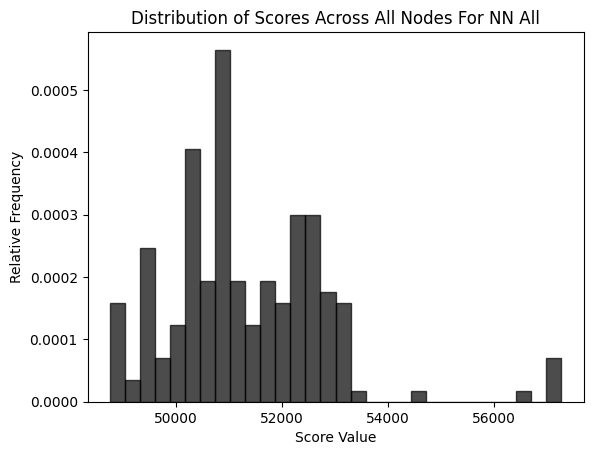

___________________________________________________________________
For Node: 136


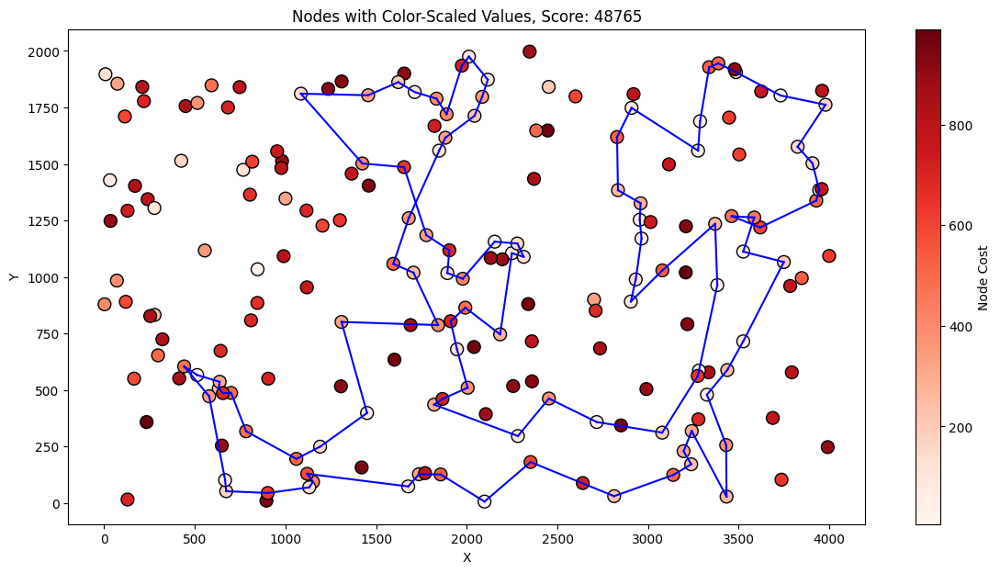

Plotting Node: 0


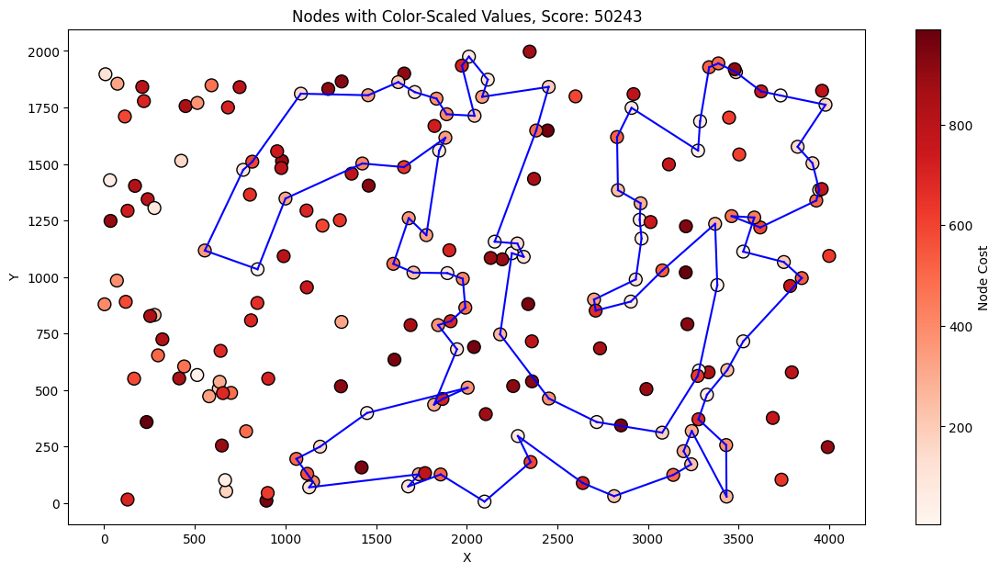

___________________________________________________________________
For Node: 34


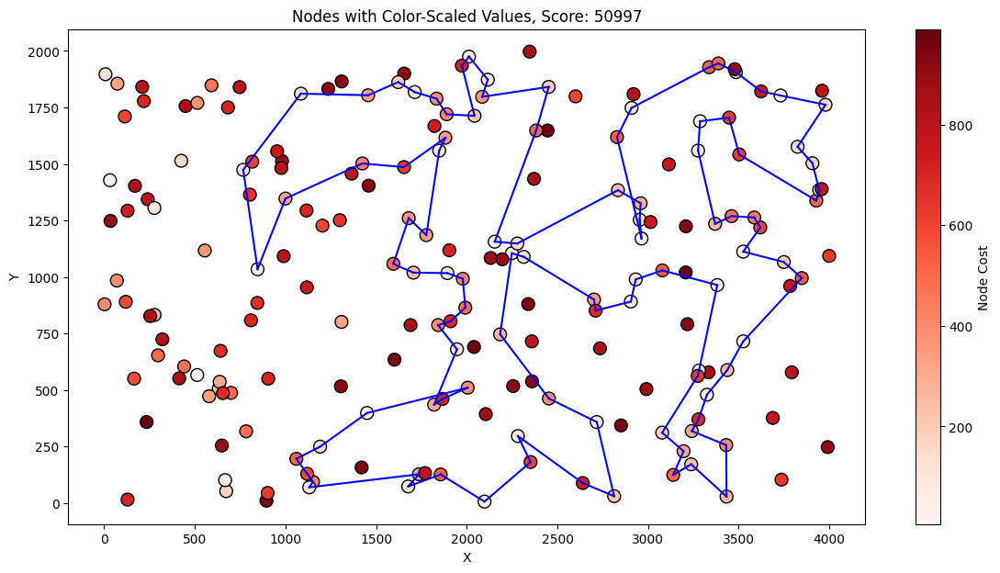

___________________________________________________________________
For Node: 17


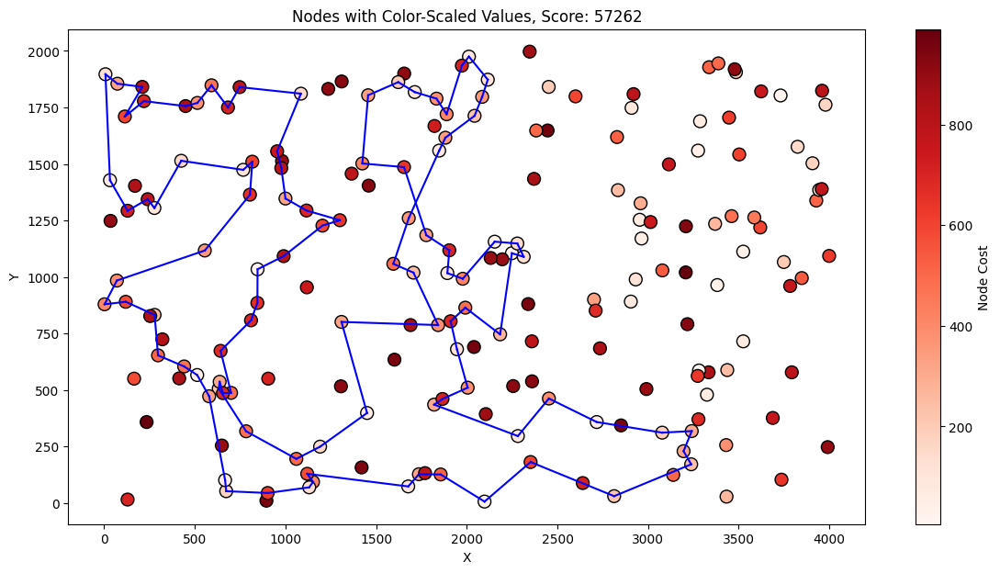

Overall Stats: 
 Minimum: 48765 Maximum: 57262 Median: 50997.0 Mean: 51344.64 Standard Deviation: 1507.818308152544


In [47]:
plot_score_distribution_not_random(cycle_results_B, label="NN All")
plot_best_overall_not_random(df_B, cycle_solutions_B, cycle_results_B)
plot_node(df_B, cycle_results_B, cycle_solutions_B, node=0)
plot_average_overall_not_random(df_B, cycle_solutions_B, cycle_results_B)
plot_worst_overall_not_random(df_B, cycle_solutions_B, cycle_results_B)
min_value, max_value, median_value, mean_value, std_deviation = calculate_stats_overall_not_random(cycle_results_B)
print(f"Overall Stats: \n Minimum: {min_value} Maximum: {max_value} Median: {median_value} Mean: {mean_value} Standard Deviation: {std_deviation}")

### All

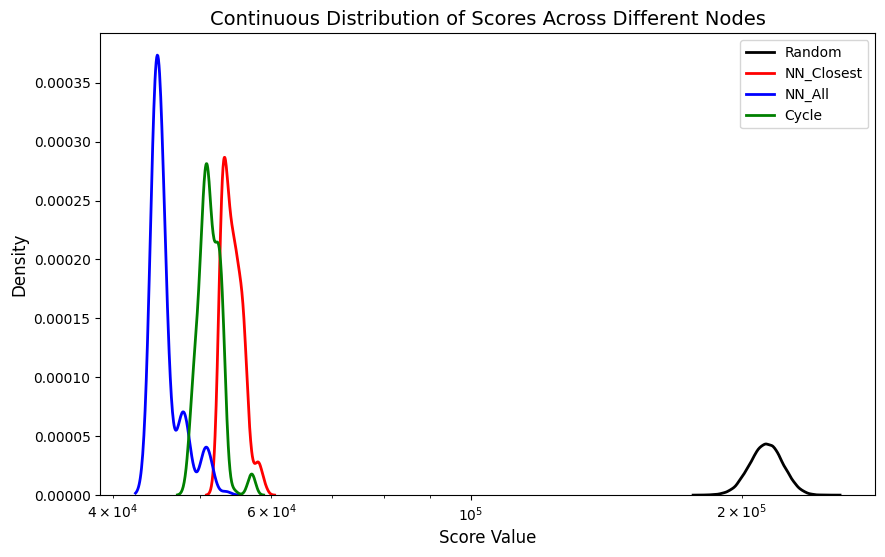

In [48]:
plot_score_distributions(random_results_B, nn_closest_results_B, nn_all_results_B, cycle_results_B, ["Random", "NN_Closest", "NN_All", "Cycle"])

In [49]:
comparison_random, comparison_nn_next, comparison_nn_all, comparison_cycle, total_results  = summarize_results(random_results_B, nn_closest_results_B, nn_all_results_B, cycle_results_B)
comparison_random

,0,1,2,3,4,5,6,7,8,9,...,190,191,192,193,194,195,196,197,198,199
Best Score:,191003.0,187858.000,183043.000,189876.00,181043.000,184871.000,188807.00,189059.000,182180.00,190194.0,...,189841.00,194125.00,192674.00,192124.00,184774.000,189513.0,191064.0,187126.000,187209.000,195726.00
Worst Score:,239906.0,239183.000,243270.000,243728.00,236920.000,233901.000,238210.00,238785.000,238711.00,236255.0,...,234709.00,238566.00,236413.00,237454.00,233609.000,240514.0,240946.0,236101.000,231061.000,238003.00
Median Score:,212176.5,214569.500,212984.000,212100.50,213764.500,213528.000,212937.50,213007.000,213063.50,215413.0,...,213544.50,213180.50,214593.00,213193.50,213230.000,213629.0,213547.0,213058.000,212467.000,212862.00
Average Score,212393.0,214438.275,213186.605,212425.86,213682.595,213096.425,213426.75,213158.005,212690.85,214717.9,...,213968.19,213076.84,214340.75,212679.35,213170.505,213740.3,213466.7,214073.295,212556.875,213663.59


In [50]:
comparison_nn_next

,0,1,2,3,4,5,6,7,8,9,...,190,191,192,193,194,195,196,197,198,199
Best Score:,55374.0,52584.0,54369.0,53796.0,55335.0,54997.0,55492.0,54592.0,55937.0,54625.0,...,53189.0,53220.0,53520.0,53429.0,56027.0,53942.0,53643.0,52323.0,52537.0,55398.0
Worst Score:,55374.0,52584.0,54369.0,53796.0,55335.0,54997.0,55492.0,54592.0,55937.0,54625.0,...,53189.0,53220.0,53520.0,53429.0,56027.0,53942.0,53643.0,52323.0,52537.0,55398.0
Median Score:,55374.0,52584.0,54369.0,53796.0,55335.0,54997.0,55492.0,54592.0,55937.0,54625.0,...,53189.0,53220.0,53520.0,53429.0,56027.0,53942.0,53643.0,52323.0,52537.0,55398.0
Average Score,55374.0,52584.0,54369.0,53796.0,55335.0,54997.0,55492.0,54592.0,55937.0,54625.0,...,53189.0,53220.0,53520.0,53429.0,56027.0,53942.0,53643.0,52323.0,52537.0,55398.0


In [51]:
comparison_nn_all

,0,1,2,3,4,5,6,7,8,9,...,190,191,192,193,194,195,196,197,198,199
Best Score:,45371.0,44472.0,46939.0,45841.0,44446.0,44472.0,45371.0,45101.0,47851.0,47550.0,...,44472.0,44746.0,45592.0,44417.0,44446.0,45371.0,45790.0,44683.0,44472.0,44824.0
Worst Score:,45371.0,44472.0,46939.0,45841.0,44446.0,44472.0,45371.0,45101.0,47851.0,47550.0,...,44472.0,44746.0,45592.0,44417.0,44446.0,45371.0,45790.0,44683.0,44472.0,44824.0
Median Score:,45371.0,44472.0,46939.0,45841.0,44446.0,44472.0,45371.0,45101.0,47851.0,47550.0,...,44472.0,44746.0,45592.0,44417.0,44446.0,45371.0,45790.0,44683.0,44472.0,44824.0
Average Score,45371.0,44472.0,46939.0,45841.0,44446.0,44472.0,45371.0,45101.0,47851.0,47550.0,...,44472.0,44746.0,45592.0,44417.0,44446.0,45371.0,45790.0,44683.0,44472.0,44824.0


In [52]:
comparison_cycle

,0,1,2,3,4,5,6,7,8,9,...,190,191,192,193,194,195,196,197,198,199
Best Score:,50243.0,52995.0,49617.0,52260.0,51849.0,50295.0,49413.0,50648.0,50141.0,51895.0,...,48765.0,52727.0,51626.0,50546.0,50970.0,49413.0,52611.0,53252.0,48933.0,52247.0
Worst Score:,50243.0,52995.0,49617.0,52260.0,51849.0,50295.0,49413.0,50648.0,50141.0,51895.0,...,48765.0,52727.0,51626.0,50546.0,50970.0,49413.0,52611.0,53252.0,48933.0,52247.0
Median Score:,50243.0,52995.0,49617.0,52260.0,51849.0,50295.0,49413.0,50648.0,50141.0,51895.0,...,48765.0,52727.0,51626.0,50546.0,50970.0,49413.0,52611.0,53252.0,48933.0,52247.0
Average Score,50243.0,52995.0,49617.0,52260.0,51849.0,50295.0,49413.0,50648.0,50141.0,51895.0,...,48765.0,52727.0,51626.0,50546.0,50970.0,49413.0,52611.0,53252.0,48933.0,52247.0


In [53]:
total_results

,0,1,2,3,4,5,6,7,8,9,...,190,191,192,193,194,195,196,197,198,199
Best Maximum Score,NN All,NN All,NN All,NN All,NN All,NN All,NN All,NN All,NN All,NN All,...,NN All,NN All,NN All,NN All,NN All,NN All,NN All,NN All,NN All,NN All
Best Minimum Score,NN All,NN All,NN All,NN All,NN All,NN All,NN All,NN All,NN All,NN All,...,NN All,NN All,NN All,NN All,NN All,NN All,NN All,NN All,NN All,NN All
Best Average Score,NN All,NN All,NN All,NN All,NN All,NN All,NN All,NN All,NN All,NN All,...,NN All,NN All,NN All,NN All,NN All,NN All,NN All,NN All,NN All,NN All
Best Median Score,NN All,NN All,NN All,NN All,NN All,NN All,NN All,NN All,NN All,NN All,...,NN All,NN All,NN All,NN All,NN All,NN All,NN All,NN All,NN All,NN All


## Comparing Both Instances

In [54]:
def plot_all_distributions(score_dict_1, score_dict_2, score_dict_3, score_dict_4, score_dict_5, score_dict_6, score_dict_7, score_dict_8):
    all_scores_1 = []
    for key in score_dict_1.keys():
        for item in score_dict_1[key]:
            all_scores_1.append(item)

    all_scores_2 = []
    for key in score_dict_2.keys():
        item = score_dict_2[key]
        all_scores_2.append(item)

    all_scores_3 = []
    for key in score_dict_3.keys():
        item = score_dict_3[key]
        all_scores_3.append(item)

    all_scores_4 = []
    for key in score_dict_4.keys():
        item = score_dict_4[key]
        all_scores_4.append(item)

    all_scores_5 = []
    for key in score_dict_5.keys():
        for item in score_dict_5[key]:
            all_scores_5.append(item)

    all_scores_6 = []
    for key in score_dict_6.keys():
        item = score_dict_6[key]
        all_scores_6.append(item)

    all_scores_7 = []
    for key in score_dict_7.keys():
        item = score_dict_7[key]
        all_scores_7.append(item)

    all_scores_8 = []
    for key in score_dict_8.keys():
        item = score_dict_8[key]
        all_scores_8.append(item)
    
    plt.figure(figsize=(18, 12))

    all_scores_1 = np.array(all_scores_1)
    all_scores_2 = np.array(all_scores_2)
    all_scores_3 = np.array(all_scores_3)
    all_scores_4 = np.array(all_scores_4)
    all_scores_5 = np.array(all_scores_5)
    all_scores_6 = np.array(all_scores_6)
    all_scores_7 = np.array(all_scores_7)
    all_scores_8 = np.array(all_scores_8)

    to_plot = [np.mean(all_scores_1), np.mean(all_scores_2), np.mean(all_scores_3), np.mean(all_scores_4), np.mean(all_scores_5), np.mean(all_scores_6), np.mean(all_scores_7), np.mean(all_scores_8)]
    labels = ['Random TSP A', 'NN Closest TSP A', 'NN All TSP A', 'Greedy Cycle TSP A',
            'Random TSP B', 'NN Closest TSP B', 'NN All TSP B', 'Greedy Cycle TSP B']
    sorted_indices = np.argsort(to_plot)[::-1]
    to_plot_sorted = np.array(to_plot)[sorted_indices]
    labels_sorted = np.array(labels)[sorted_indices]

    # Plotting the bar chart
    plt.figure(figsize=(16, 6))
    plt.yscale('log')
    plt.bar(labels_sorted, to_plot_sorted, color=['blue', 'red', 'green', 'black', 'brown', 'pink', 'orange', 'purple'])

    # Adding title and labels
    plt.title('Comparison of Mean Scores Across Different TSP Algorithms', fontsize=14)
    plt.xlabel('TSP Algorithms', fontsize=12)
    plt.xticks(rotation=45, ha='right')
    plt.ylabel('Mean Score Logarithmic Scale)', fontsize=12)

<Figure size 1800x1200 with 0 Axes>

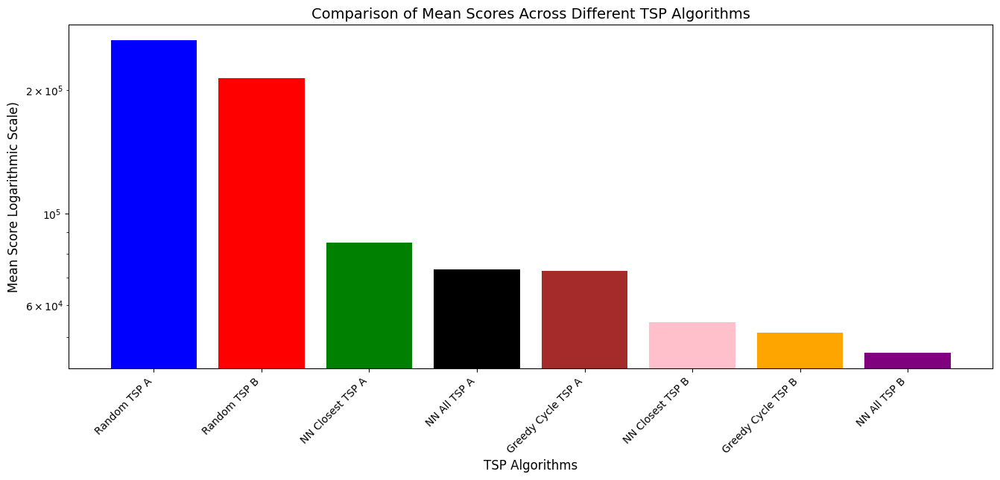

In [55]:
plot_all_distributions(random_results_A, nn_closest_results_A, nn_all_results_A, cycle_results_A, random_results_B, nn_closest_results_B, nn_all_results_B, cycle_results_B)